# Modifying the grid

This notebook demonstrates a wide range of Smith chart configurations using the `pysmithchart` library. The examples include:

- Grid styles with various major/minor grid combinations
- Fancy grid thresholds (major and minor)
- Custom grid locators for real and imaginary axes
- Normalization with different reference impedances
- Marker customizations (including rotation and custom start/end markers)
- Interpolation and equipoint settings
- Miscellaneous settings including legends and minor fancy dividers

These examples have been adapted from https://github.com/vMeijin/pySmithPlot/blob/master/testbenches/smith_full_test.py

In [1]:
%config InlineBackend.figure_format = 'retina'

import sys
import numpy as np
import matplotlib.pyplot as plt

if sys.platform == "emscripten":
    import piplite

    await piplite.install("pysmithchart")

from pysmithchart import S_PARAMETER, Z_PARAMETER, utils

In [2]:
def plot_example(title, marker="", N=100, **kwargs):
    """Helper function to plot examples."""
    Z0 = 50
    sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
    Gamma = -0.25 + 0.25 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
    z_data = utils.calc_load(Z0, Gamma)

    kwargs.setdefault("markevery", 1)
    plt.plot(sp_data, "b", marker=marker, datatype=S_PARAMETER, markersize=8, **kwargs)
    plt.plot(z_data, "r", marker=marker, datatype=Z_PARAMETER, markersize=8, **kwargs)
    plt.plot(100, datatype=Z_PARAMETER, markersize=8, **kwargs)
    plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **kwargs)
    plt.title(title)

### Grid Styles

The following examples show different grid style configurations by varying the major and minor grid options.

It is important that these settings be updated/changed in `plt.subplot()`, if they're made later they often have no effect.

Major and minor grid lines have three possible forms.

- not enabled or invisible
- standard or complete arcs
- fancy or incomplete arcs

This section shows how the three types of minor grid lines appear when the major grid lines are standard or fancy

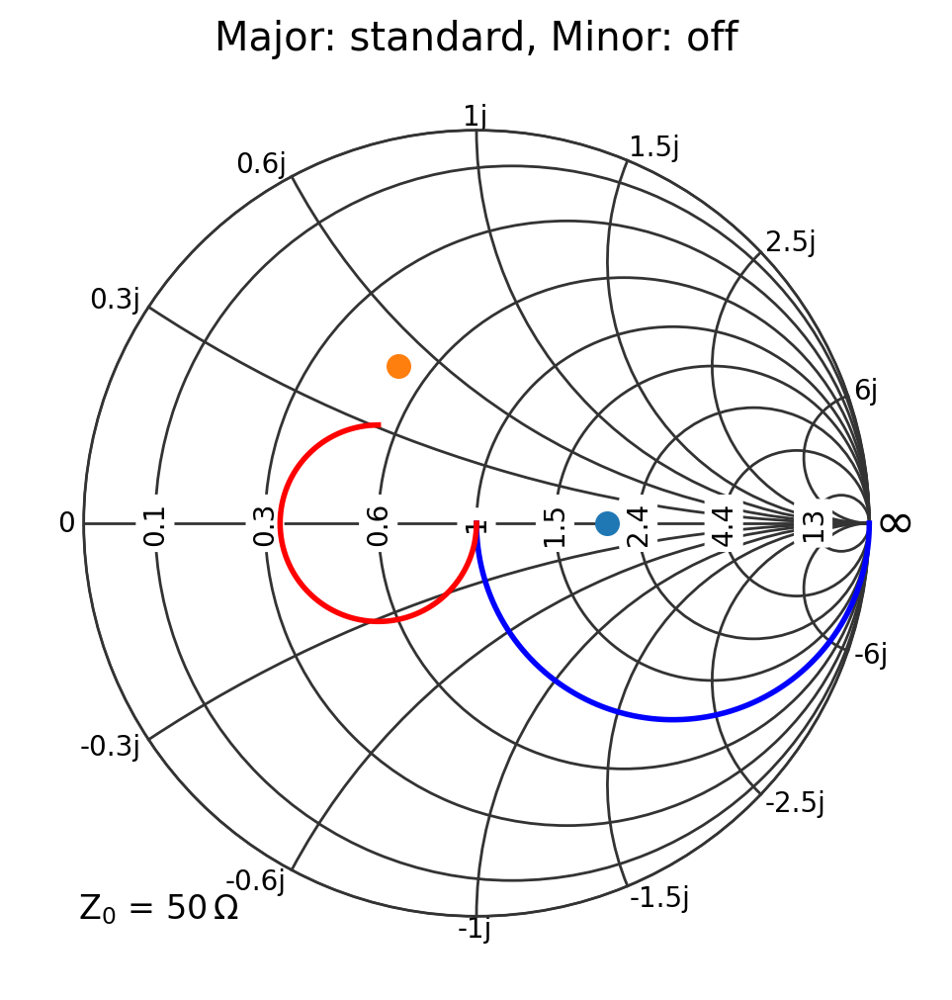

In [2]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy=False, grid_minor_enable=False)
plot_example("Major: standard, Minor: off")
plt.show()

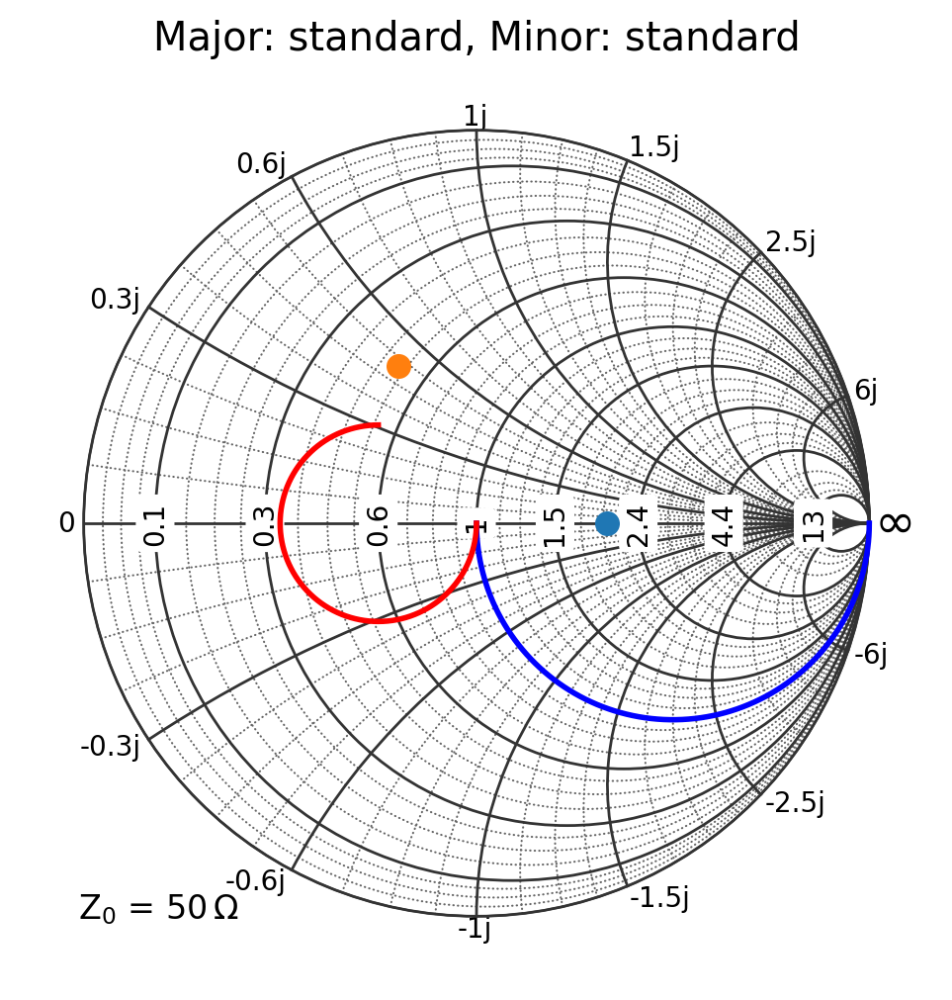

In [3]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_major_fancy=False, grid_minor_enable=True, grid_minor_fancy=False
)
plot_example("Major: standard, Minor: standard")
plt.show()

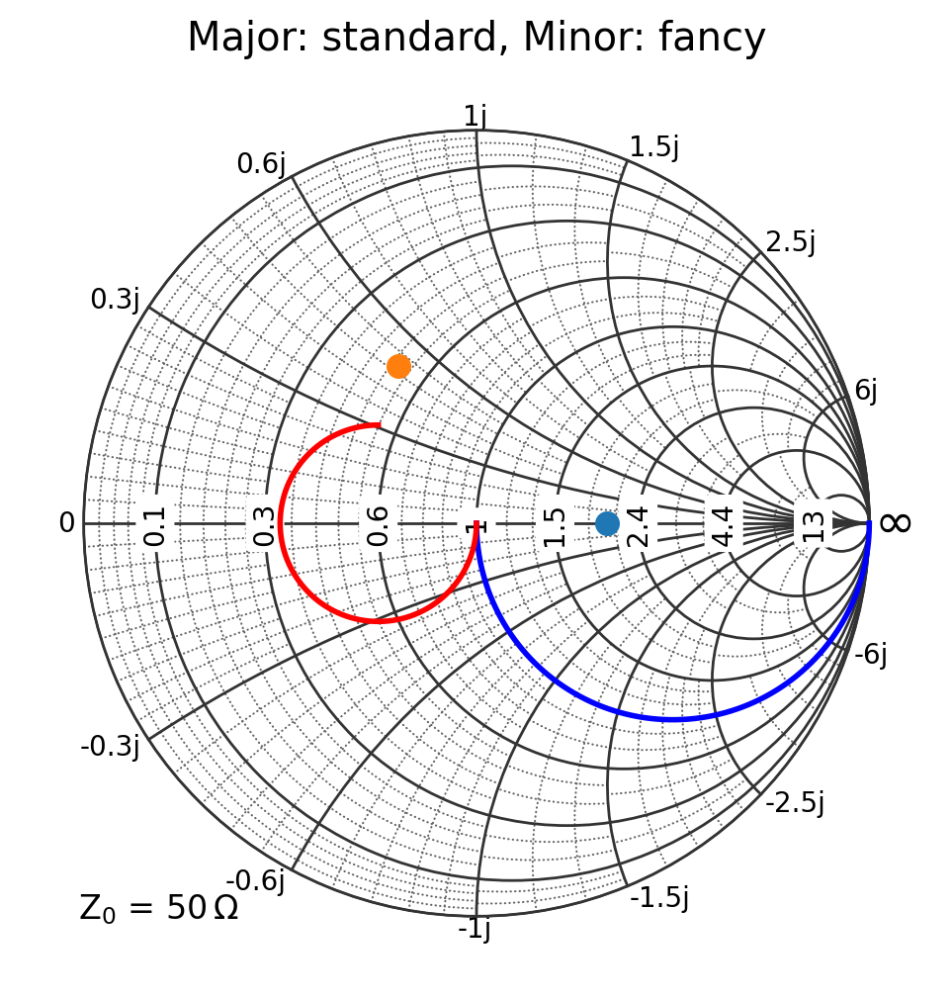

In [4]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_major_fancy=False, grid_minor_enable=True, grid_minor_fancy=True
)
plot_example("Major: standard, Minor: fancy")
plt.show()

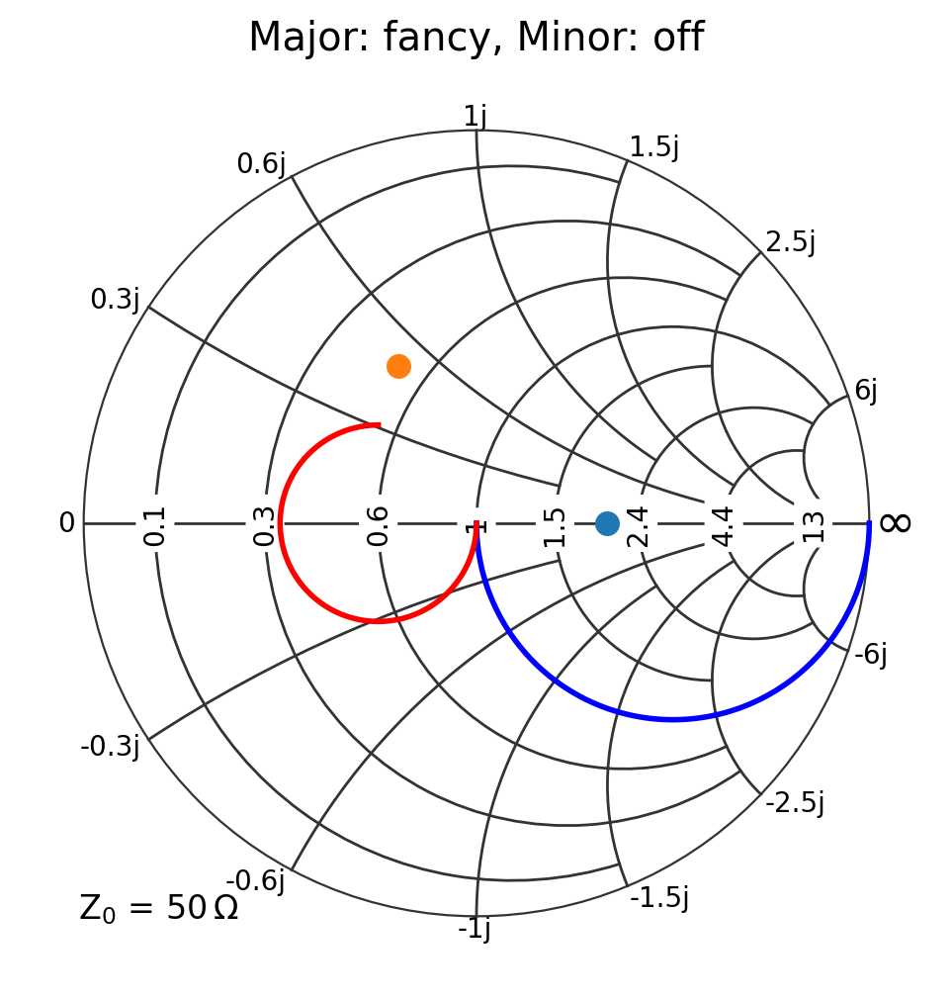

In [5]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy=True, grid_minor_enable=False)
plot_example("Major: fancy, Minor: off")
plt.show()

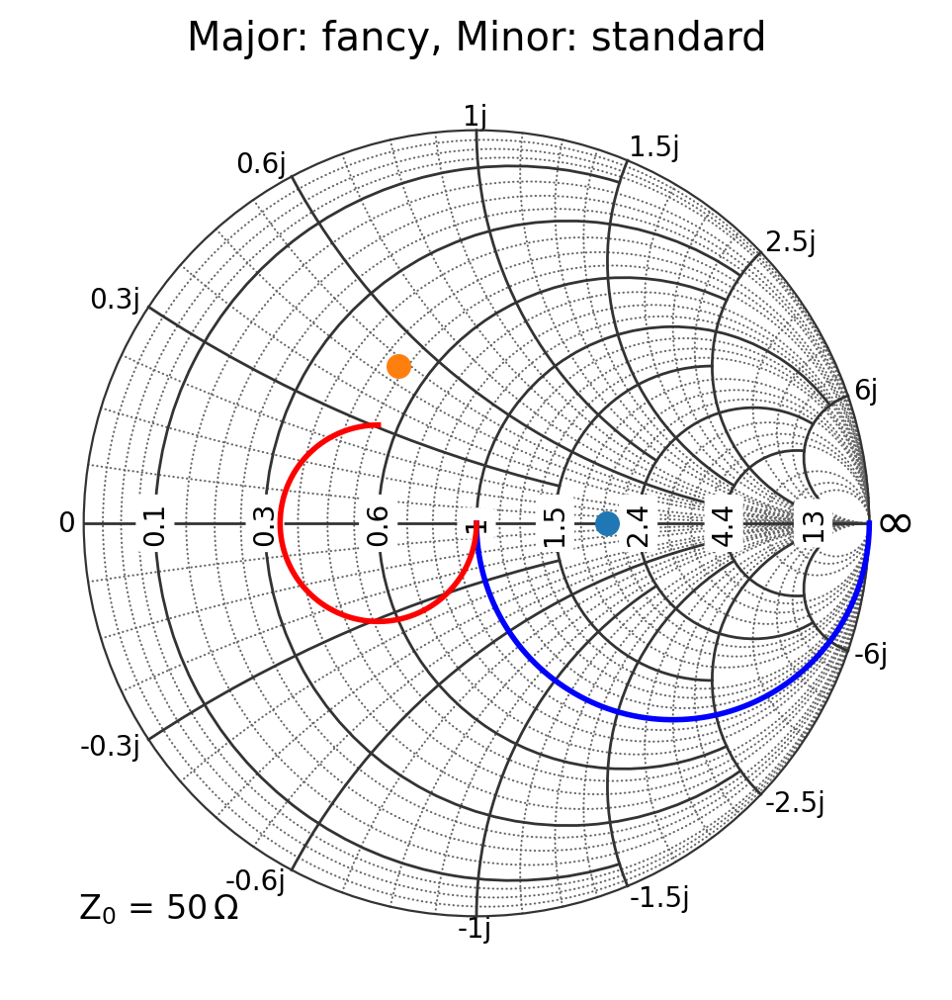

In [6]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_major_fancy=True, grid_minor_enable=True, grid_minor_fancy=False
)
plot_example("Major: fancy, Minor: standard")
plt.show()

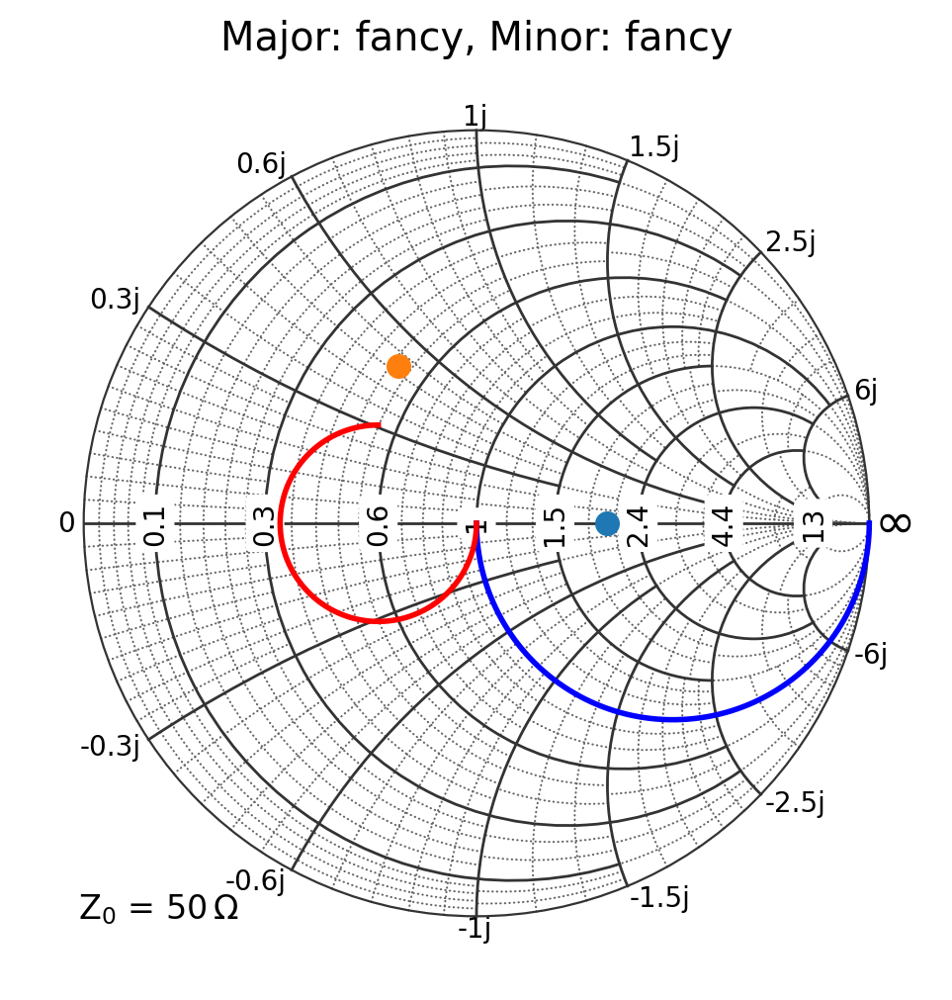

In [7]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy=True, grid_minor_enable=True, grid_minor_fancy=True)
plot_example("Major: fancy, Minor: fancy")
plt.show()

### Fancy Grids

These examples demonstrate the use of fancy grid styling with adjustable thresholds. The section is split into two parts: one for major fancy grids and one for minor fancy grids.

The threshold may be a simple scalar or a tuple `(tx, ty)`.  Scalar values use the same number for minimum x and y- separation.

There is a threshold for the major grid lines and another one for the minor grid lines.  The values are tested after transformation.

The threshold works as a sensitivity parameter: it sets how far apart (in the transformed coordinate system) grid lines must be to be drawn separately. A threshold of (100, 50) results in a requirement that differences must be at least 0.1 for the gridlines in the x-direction and 0.05 for y-values --- otherwise, the grid lines are merged into a single arc.  This helps avoid drawing grid lines that are nearly on top of each other (which can make the grid look cluttered or visually confusing).

#### Thresholds for major fancy grid lines

The following examples show major grid fancy thresholds.

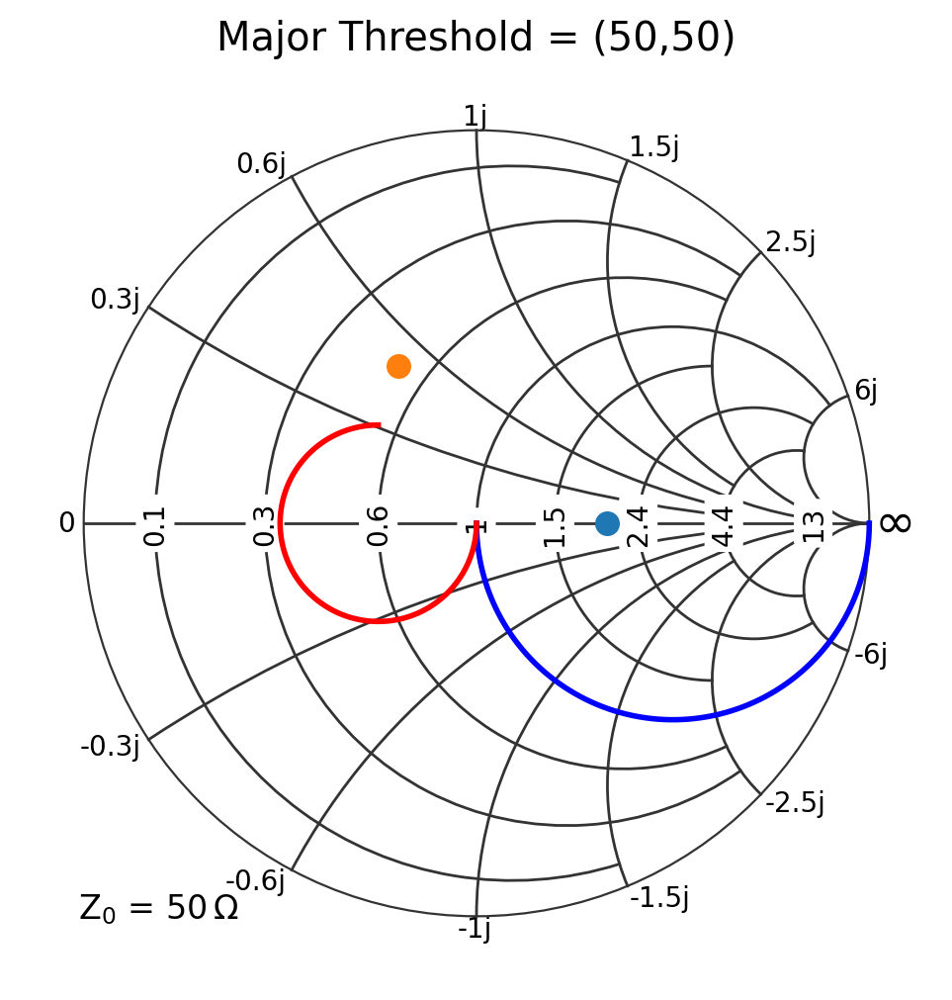

In [8]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy_threshold=(50, 50))
plot_example("Major Threshold = (50,50)")
plt.show()

we increase the x threshold and now the ±0.3j and ±1j reactance lines get shortened

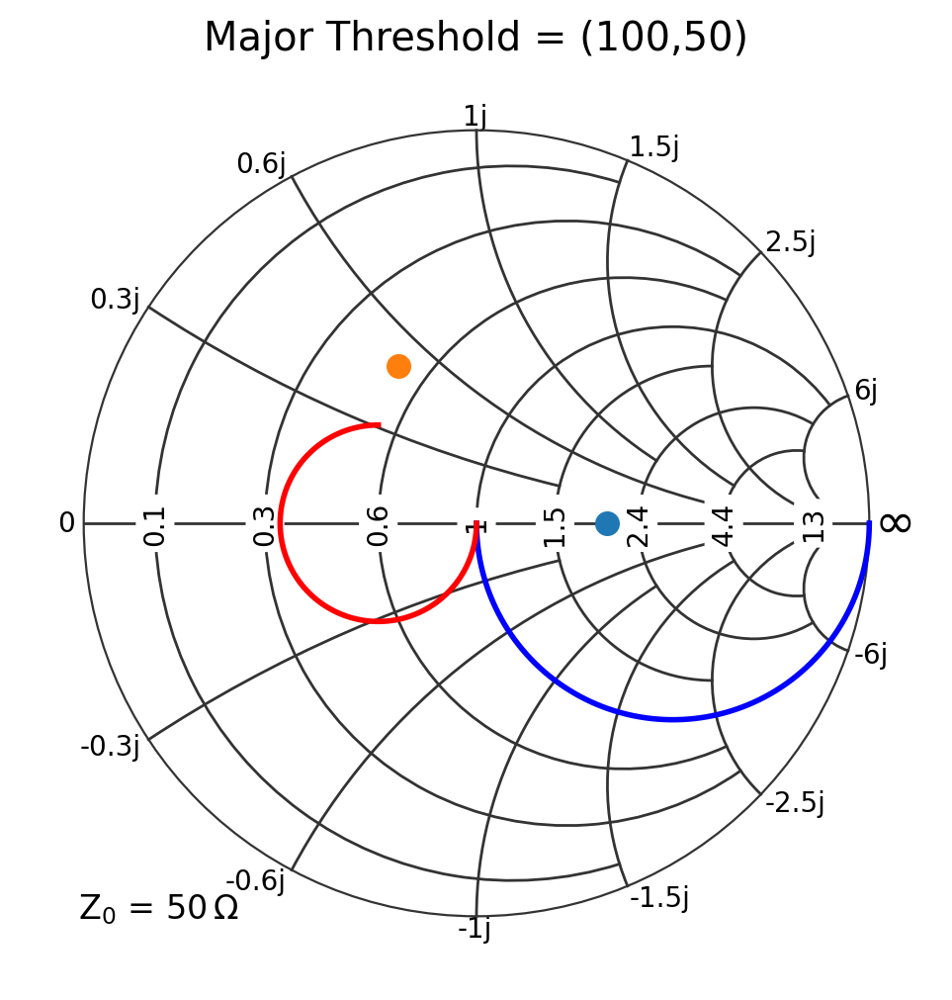

In [9]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy_threshold=(100, 50))
plot_example("Major Threshold = (100,50)")
plt.show()

we increase the y-threshold and now the 4.4 resistance circle get truncated.

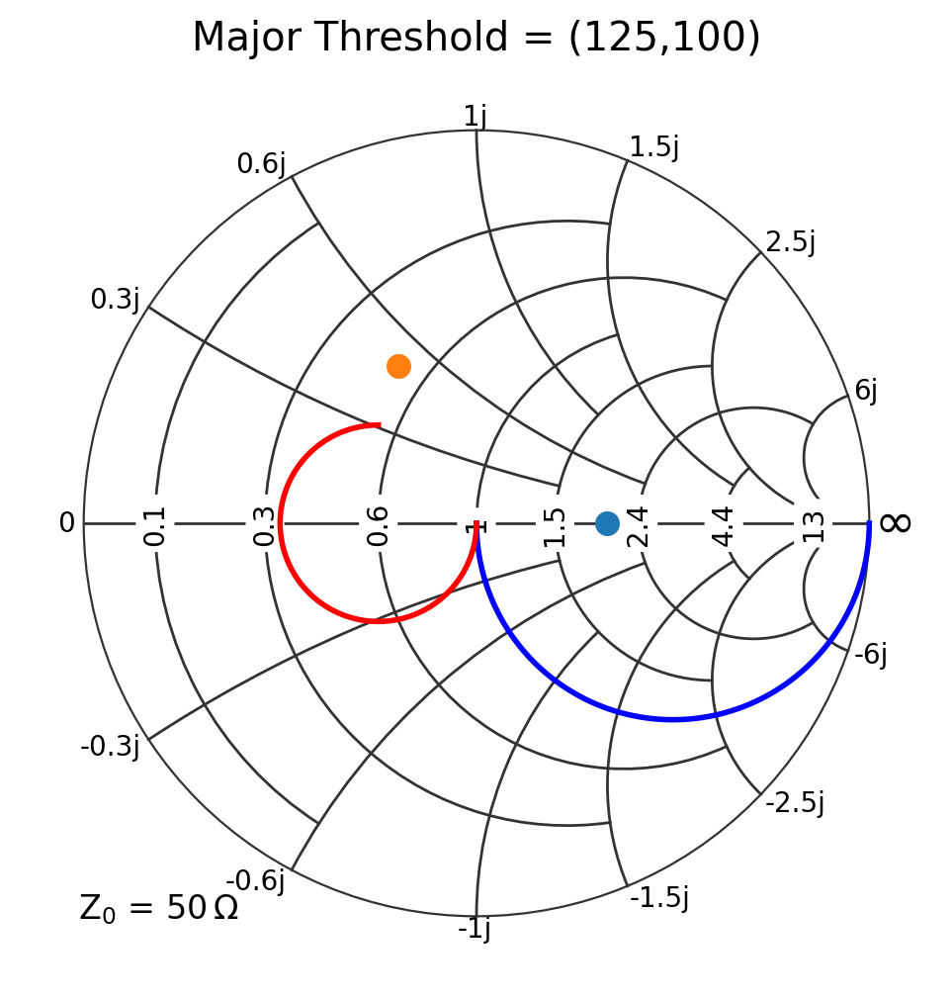

In [10]:
# Major Threshold = (125, 100)
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_fancy_threshold=(125, 100))
plot_example("Major Threshold = (125,100)")
plt.show()

### Minor fancy grid thresholds

The following examples show minor grid fancy thresholds.

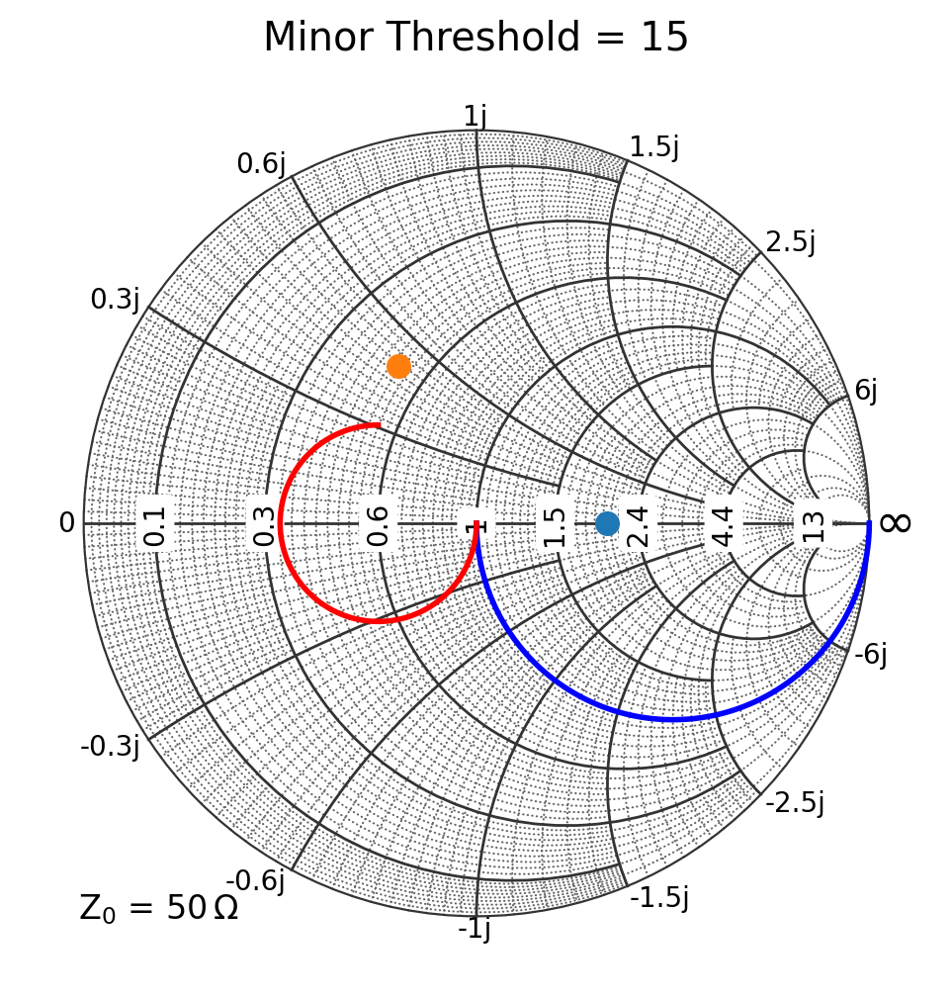

In [11]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_minor_enable=True, grid_minor_fancy=True, grid_minor_fancy_threshold=15
)
plot_example("Minor Threshold = 15")
plt.show()

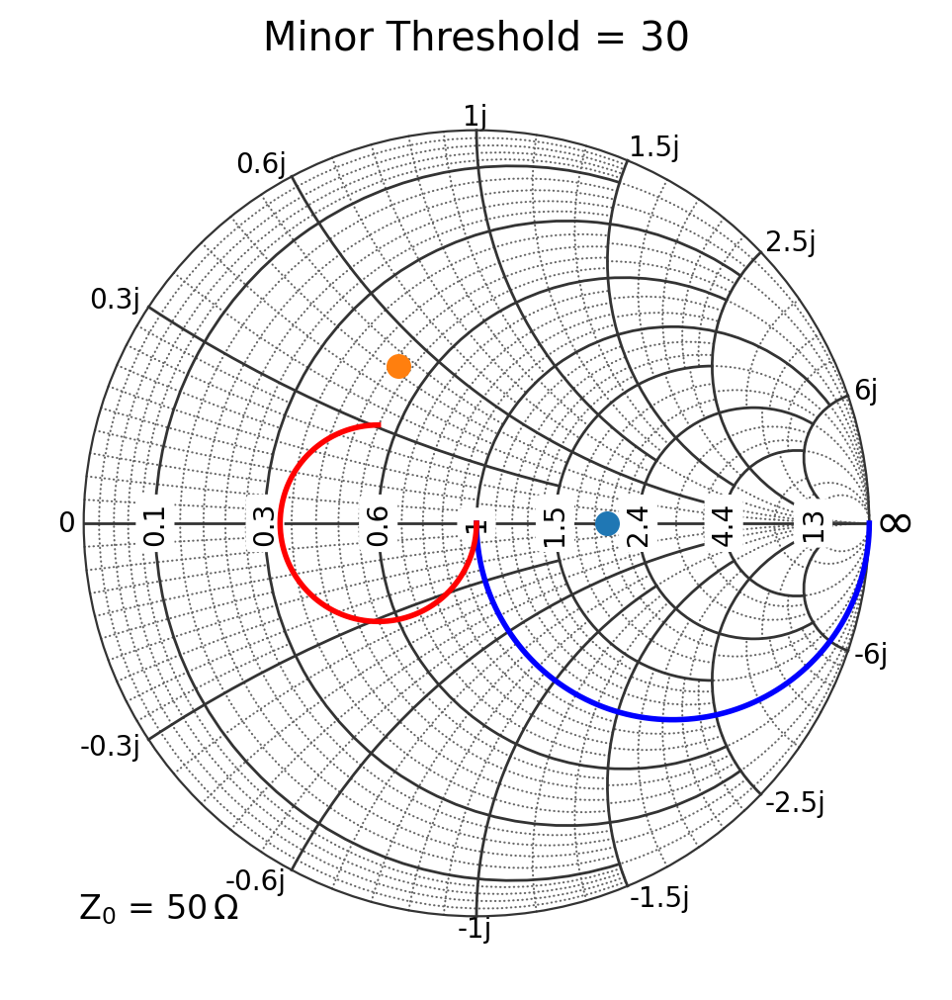

In [12]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_minor_enable=True, grid_minor_fancy=True, grid_minor_fancy_threshold=30
)
plot_example("Minor Threshold = 30")
plt.show()

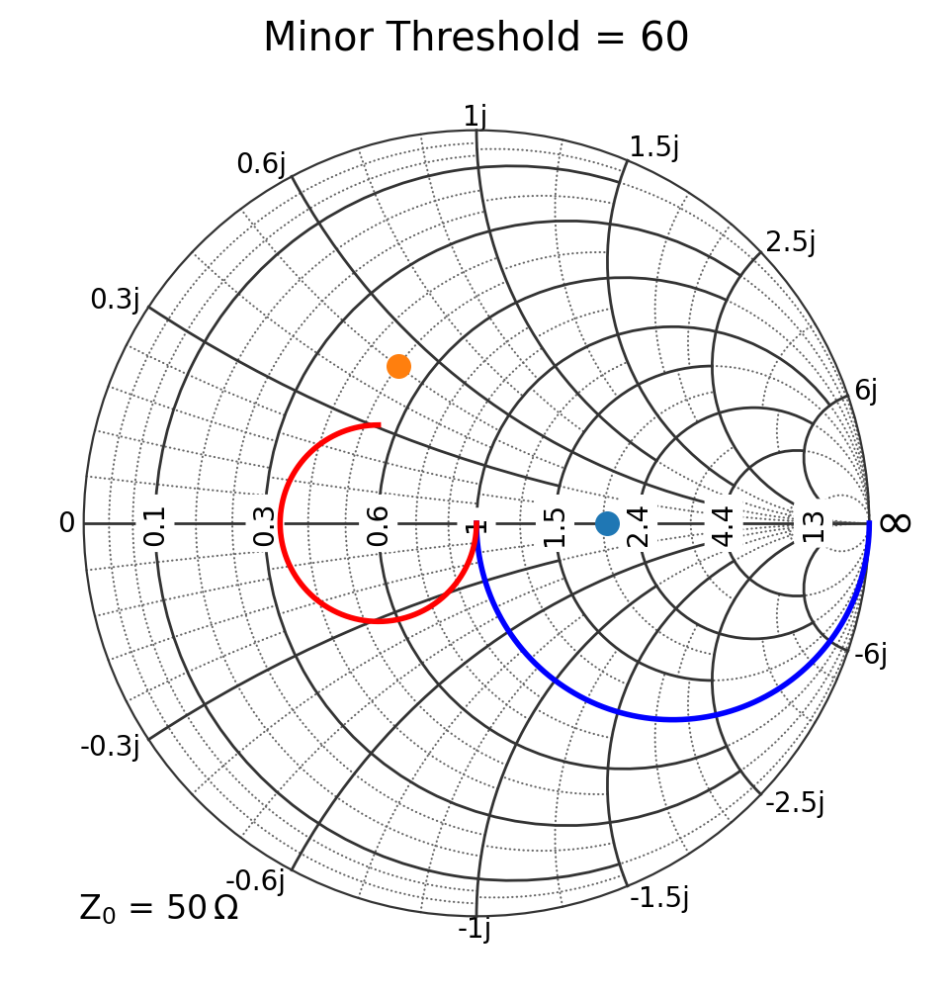

In [13]:
# Minor Threshold = 60
plt.figure(figsize=(6, 6))
plt.subplot(
    1, 1, 1, projection="smith", grid_minor_enable=True, grid_minor_fancy=True, grid_minor_fancy_threshold=60
)
plot_example("Minor Threshold = 60")
plt.show()

### Grid Locators

These examples demonstrate the use of grid locators by varying the maximum number of steps on the real and imaginary axes.

#### Real Axis (Resistance) Steps

Examples with different maximum steps for the real axis.

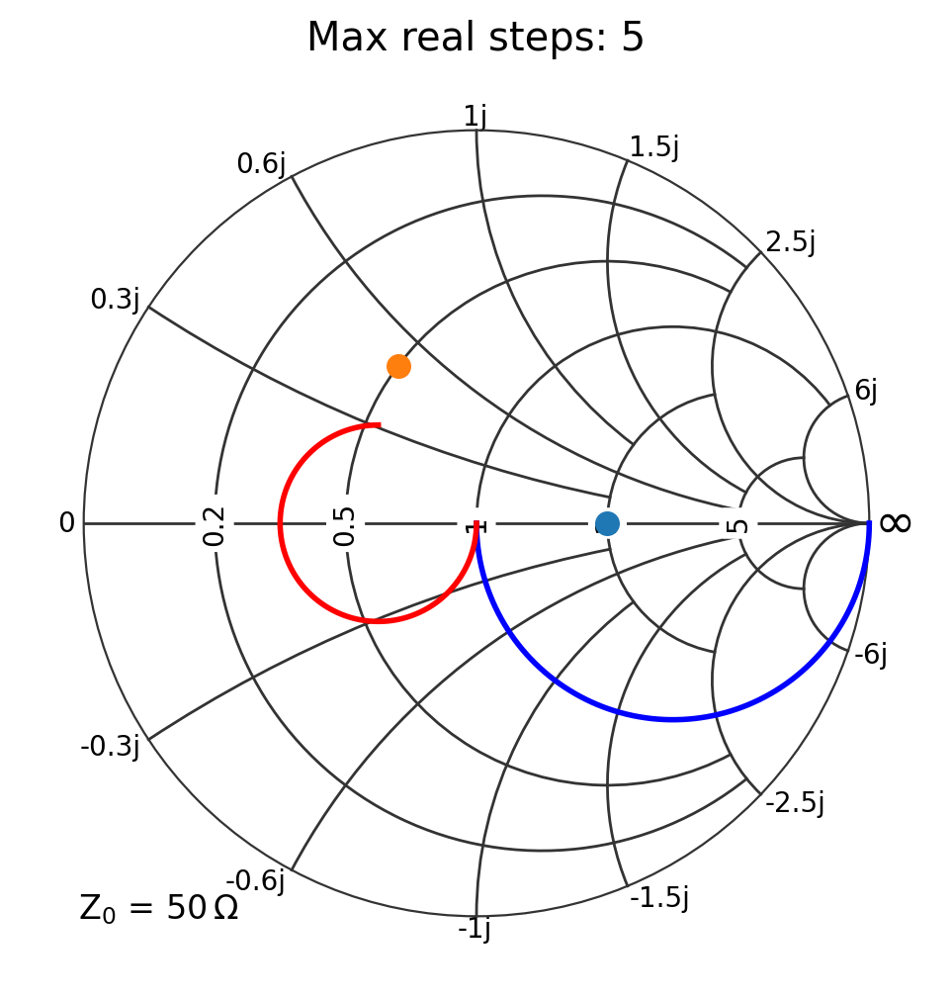

In [14]:
# Max real steps = 5
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_xmaxn=5)
plot_example("Max real steps: 5")
plt.show()

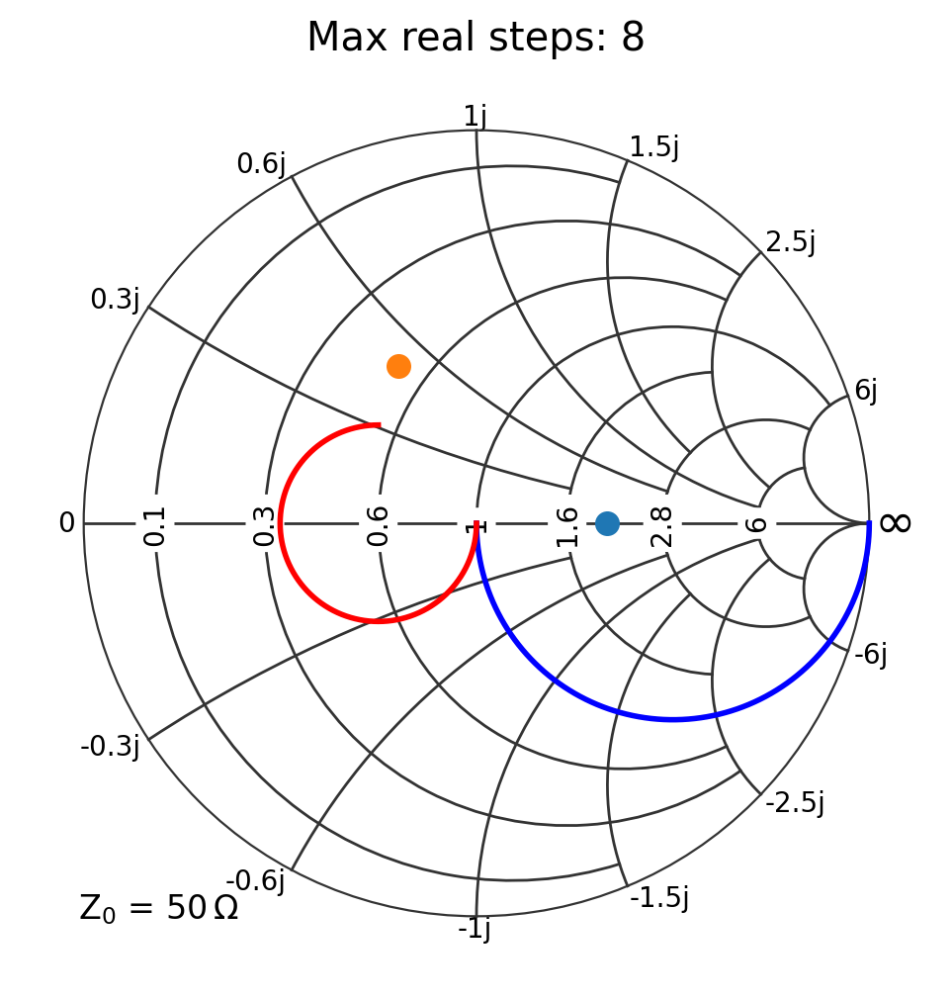

In [15]:
# Max real steps = 8
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_xmaxn=8)
plot_example("Max real steps: 8")
plt.show()

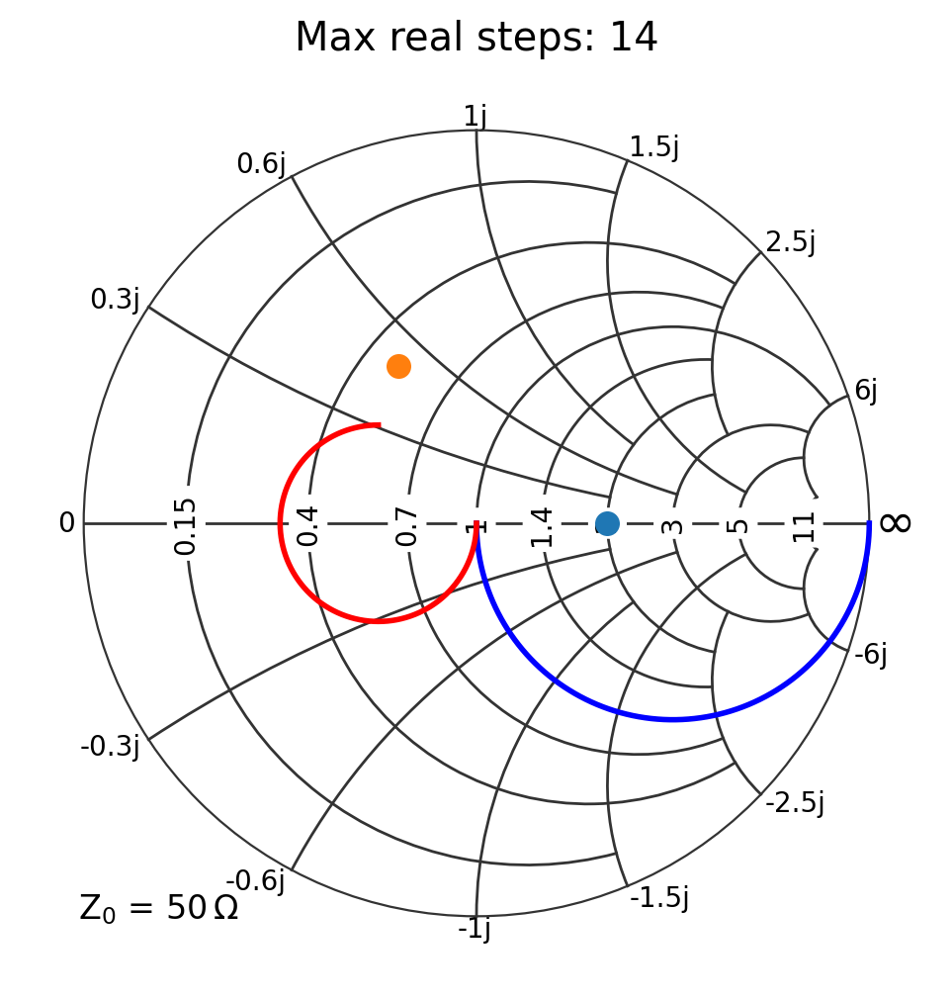

In [16]:
# Max real steps = 14
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_xmaxn=14)
plot_example("Max real steps: 14")
plt.show()

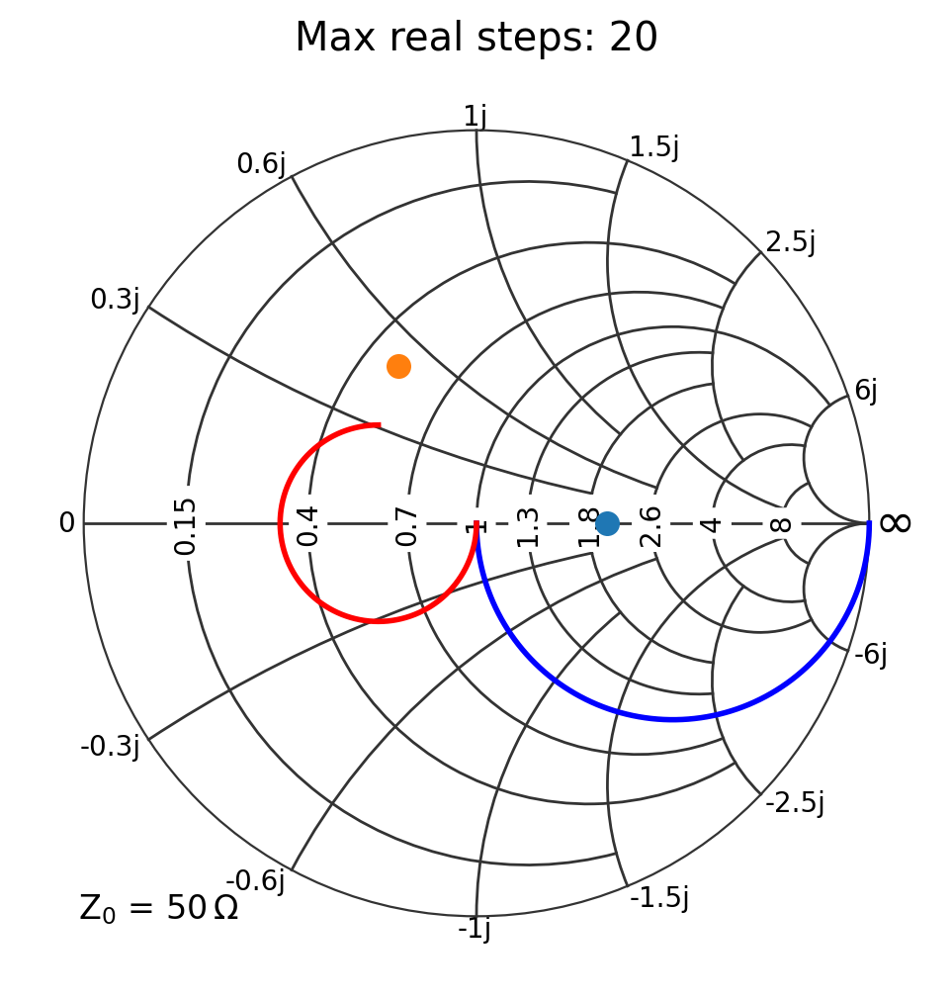

In [17]:
# Max real steps = 20
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_xmaxn=20)
plot_example("Max real steps: 20")
plt.show()

#### Imaginary Axis (Reactance) Steps

Examples with different maximum steps for the imaginary axis.

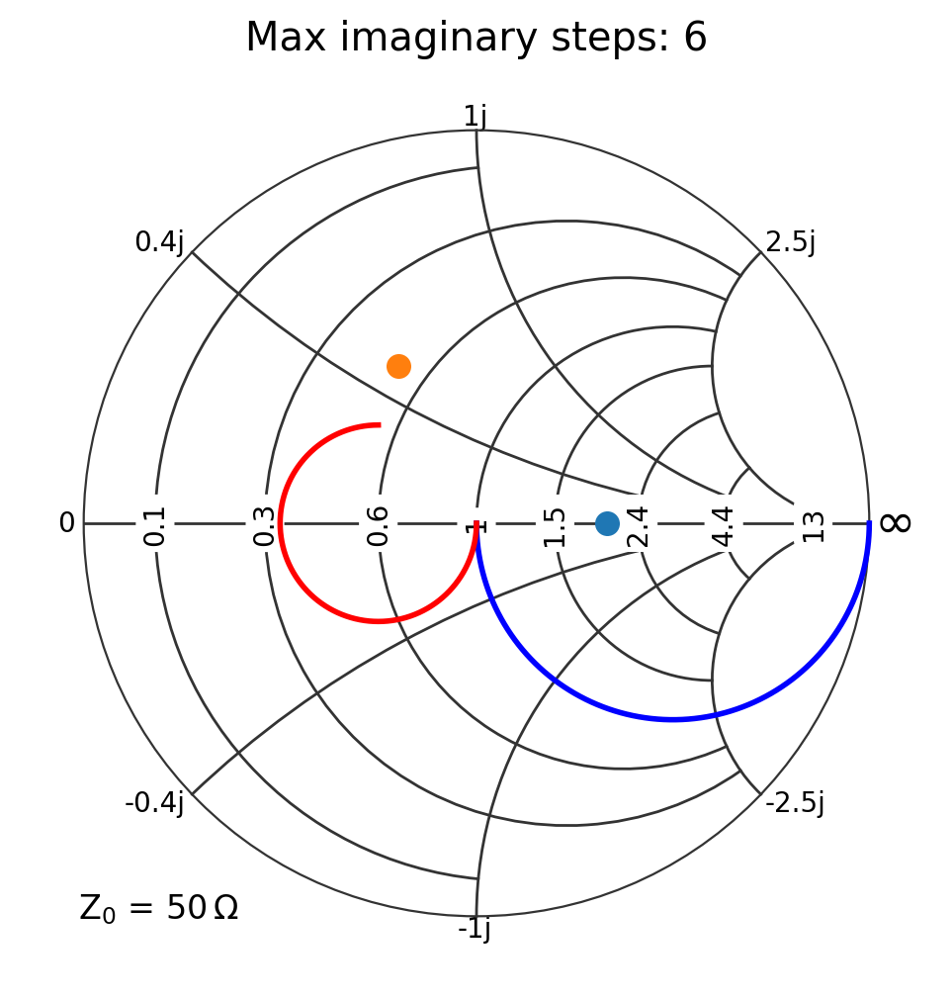

In [18]:
# Max imaginary steps = 6
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_ymaxn=6)
plot_example("Max imaginary steps: 6")
plt.show()

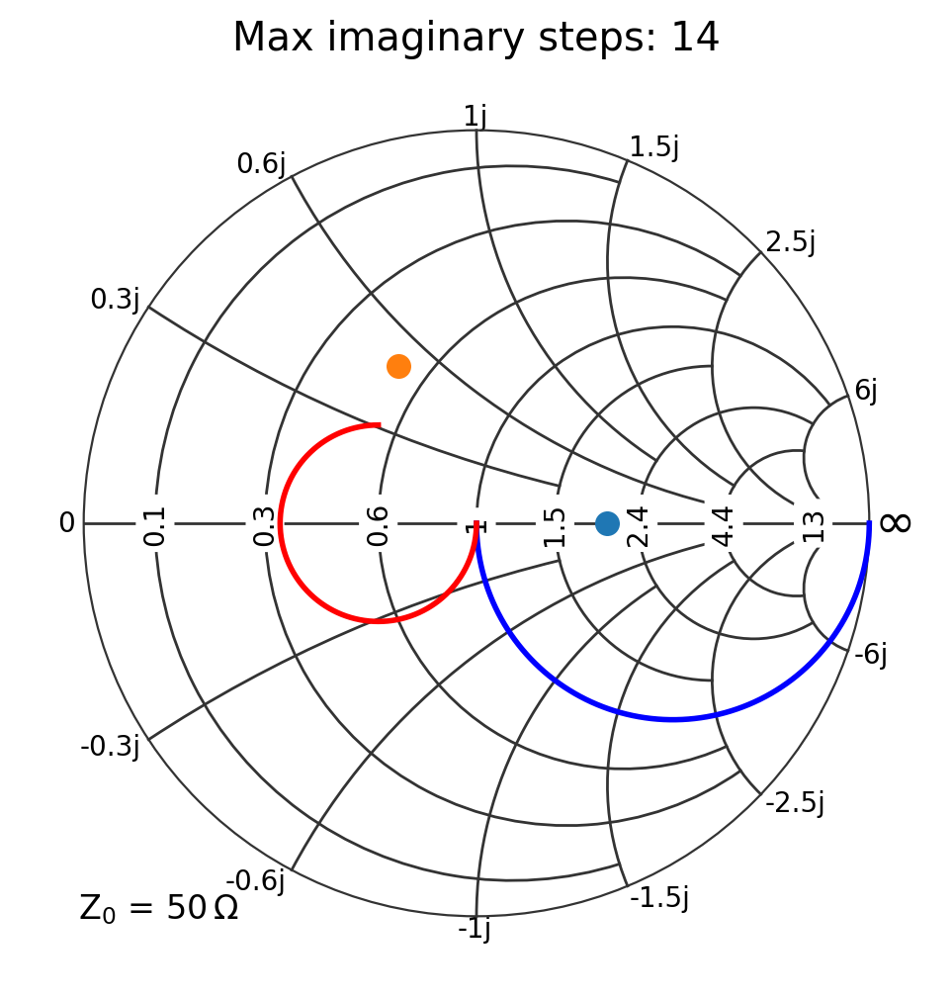

In [19]:
# Max imaginary steps = 14
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_ymaxn=14)
plot_example("Max imaginary steps: 14")
plt.show()

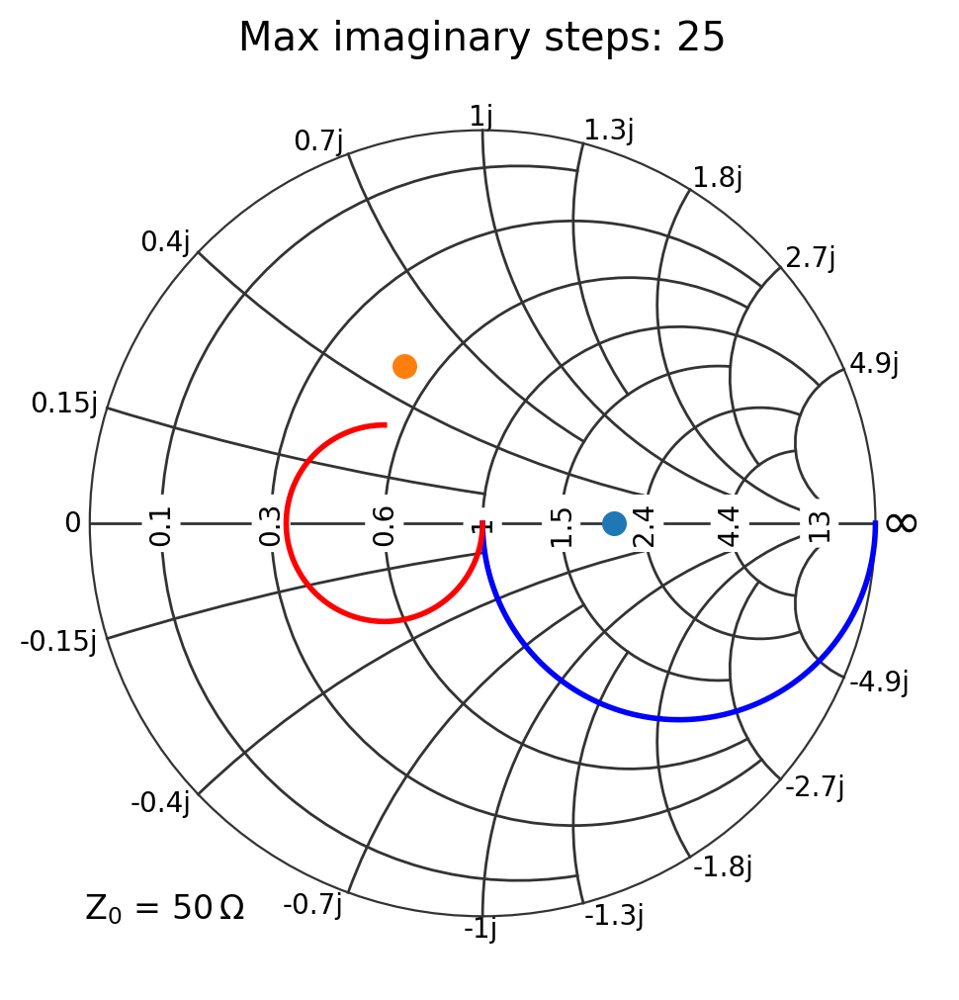

In [20]:
# Max imaginary steps = 25
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_ymaxn=25)
plot_example("Max imaginary steps: 25")
plt.show()

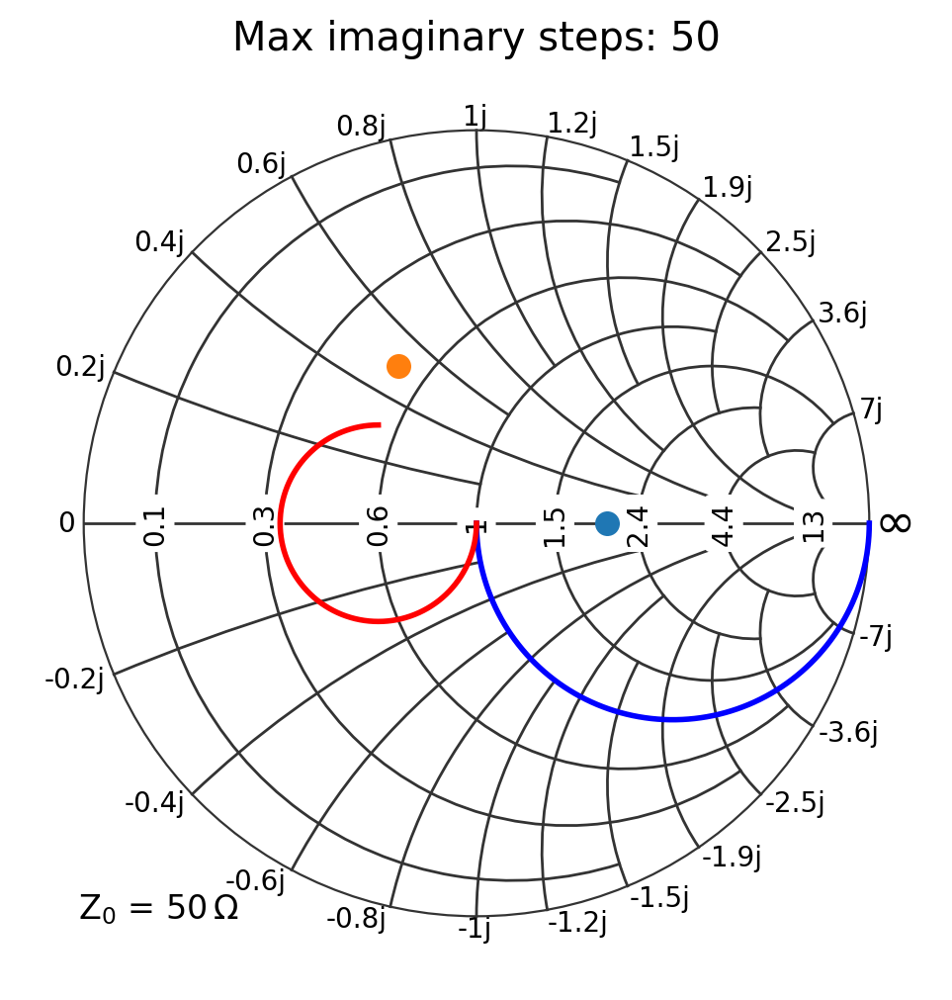

In [21]:
# Max imaginary steps = 50
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", grid_major_ymaxn=50)
plot_example("Max imaginary steps: 50")
plt.show()

### Normalization

These examples demonstrate Smith chart normalization by varying the reference impedance and whether normalization is enabled.

Each example sets a different impedance and toggles normalization on/off.

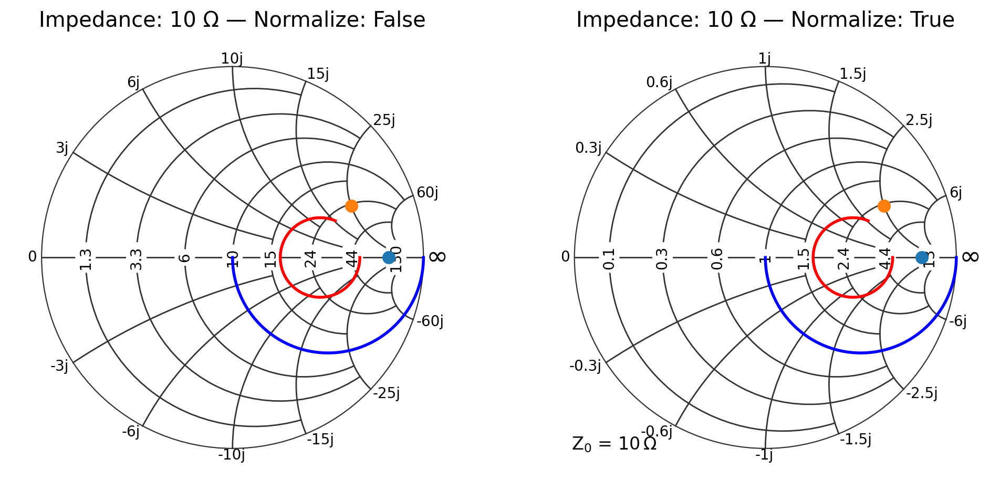

In [22]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1, projection="smith", axes_normalize=False, axes_impedance=10)
plot_example("Impedance: 10 Ω — Normalize: False")

plt.subplot(1, 2, 2, projection="smith", axes_normalize=True, axes_impedance=10)
plot_example("Impedance: 10 Ω — Normalize: True")
plt.show()

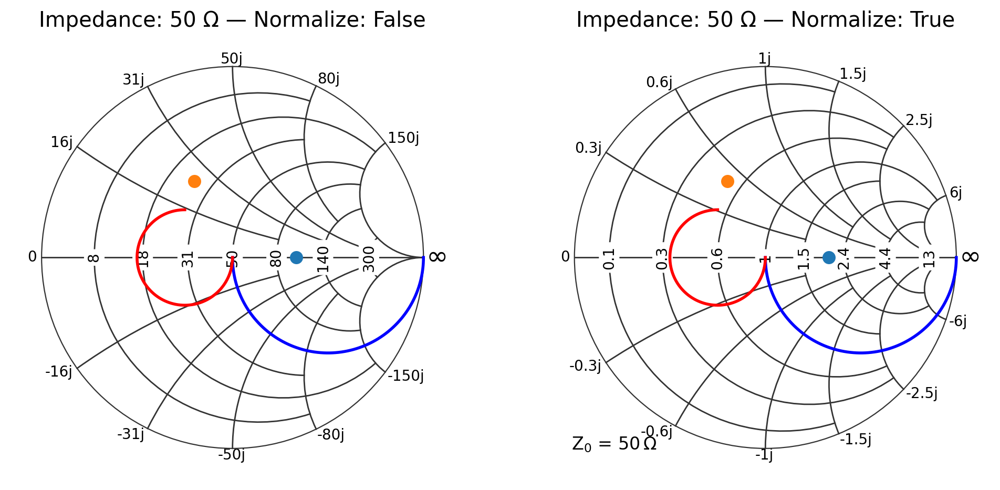

In [23]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1, projection="smith", axes_normalize=False, axes_impedance=50)
plot_example("Impedance: 50 Ω — Normalize: False")

plt.subplot(1, 2, 2, projection="smith", axes_normalize=True, axes_impedance=50)
plot_example("Impedance: 50 Ω — Normalize: True")
plt.show()

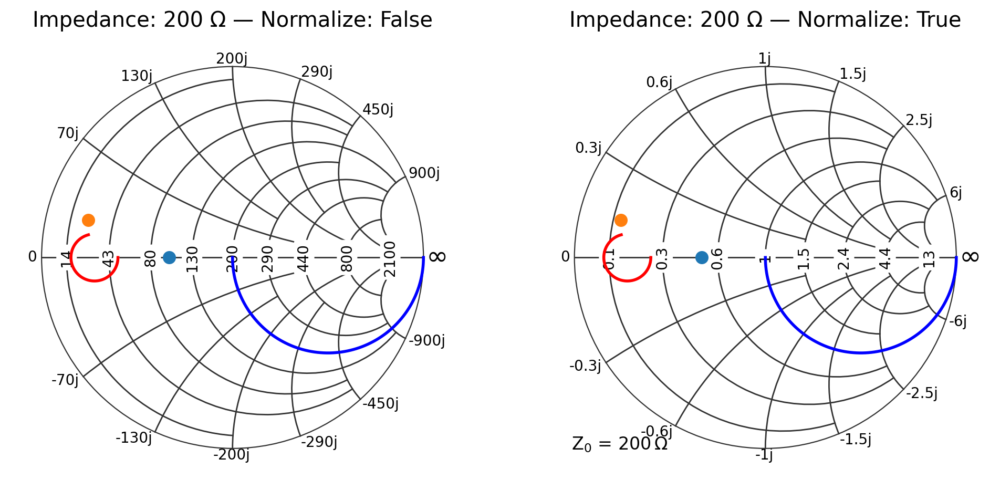

In [24]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1, projection="smith", axes_normalize=False, axes_impedance=200)
plot_example("Impedance: 200 Ω — Normalize: False")

plt.subplot(1, 2, 2, projection="smith", axes_normalize=True, axes_impedance=200)
plot_example("Impedance: 200 Ω — Normalize: True")
plt.show()

### Markers

These examples show different marker configurations. When an array of points is plotted on a Smith chart, then the start and end markers can be changed from the rest of the markers.


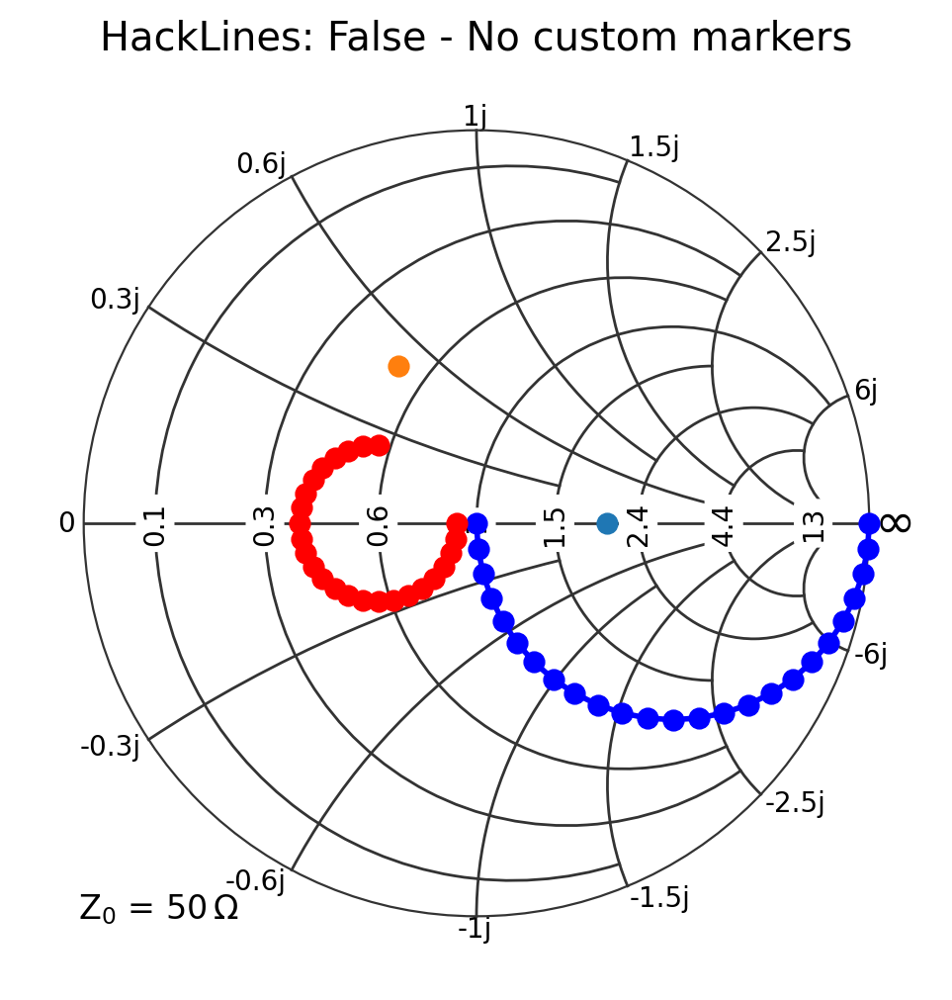

In [25]:
# Example 1: HackLines: False, StartMarker: None, EndMarker: None, Rotate: False
sc = {
    "plot_marker_hack": False,
    "plot_marker_rotate": False,
    "plot_marker_start": None,
    "plot_marker_end": None,
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", datatype=S_PARAMETER, markersize=7, **mykw)
plt.plot(z_data, "r", datatype=Z_PARAMETER, markersize=7, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=7, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=7, **mykw)
plt.title("HackLines: False - No custom markers")
plt.show()

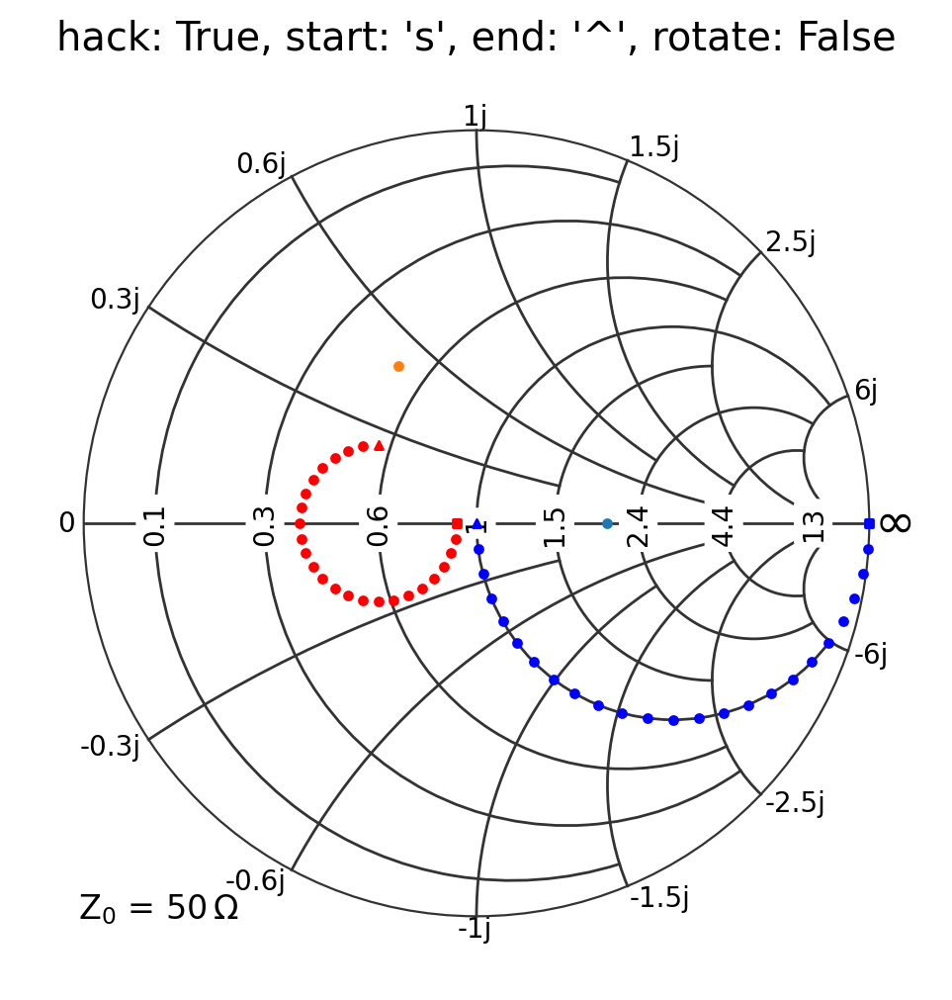

In [26]:
# Example 2: HackLines: True, StartMarker: 's', EndMarker: '^', Rotate: False
sc = {
    "plot_marker_hack": True,
    "plot_marker_rotate": False,
    "plot_marker_start": "s",
    "plot_marker_end": "^",
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", ls="", datatype=S_PARAMETER, markersize=8, **mykw)
plt.plot(z_data, "r", ls="", datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.title("hack: True, start: 's', end: '^', rotate: False")
plt.show()

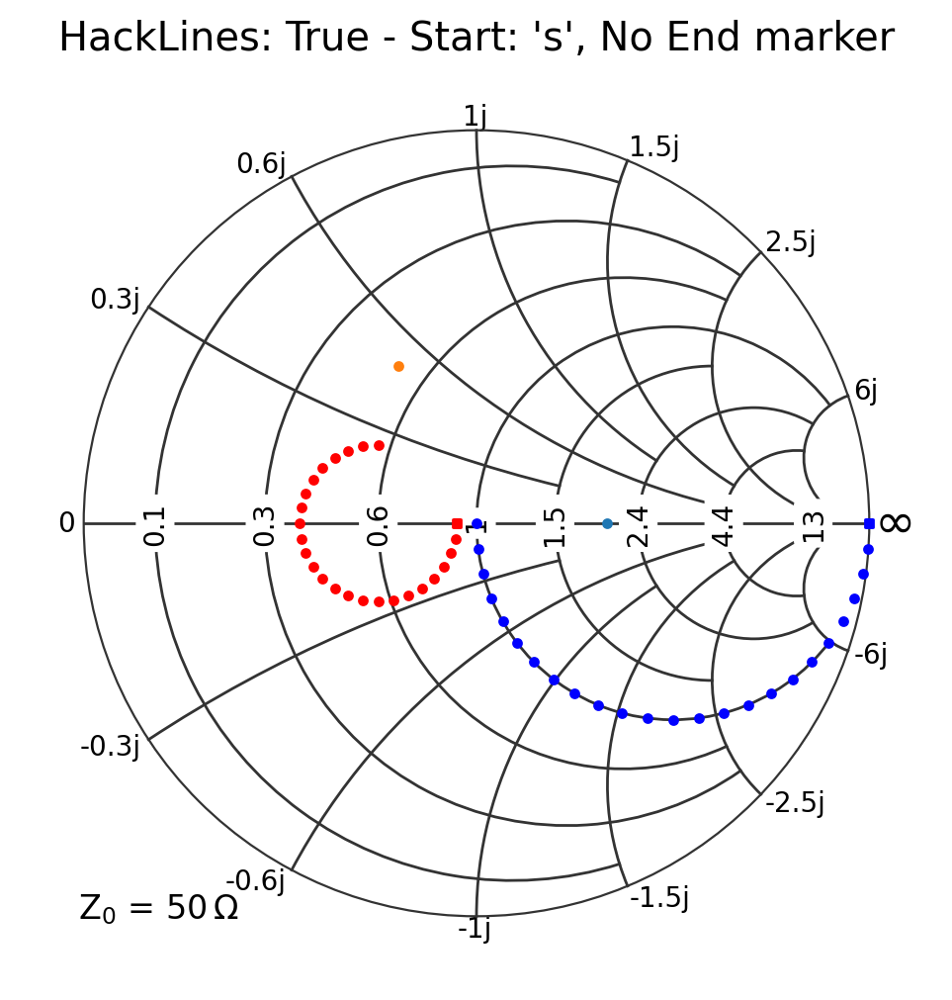

In [27]:
# Example 3: HackLines: True, StartMarker: 's', EndMarker: None, Rotate: False
sc = {
    "plot_marker_hack": True,
    "plot_marker_rotate": False,
    "plot_marker_start": "s",
    "plot_marker_end": None,
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", ls="", datatype=S_PARAMETER, markersize=8, **mykw)
plt.plot(z_data, "r", ls="", datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.title("HackLines: True - Start: 's', No End marker")
plt.show()

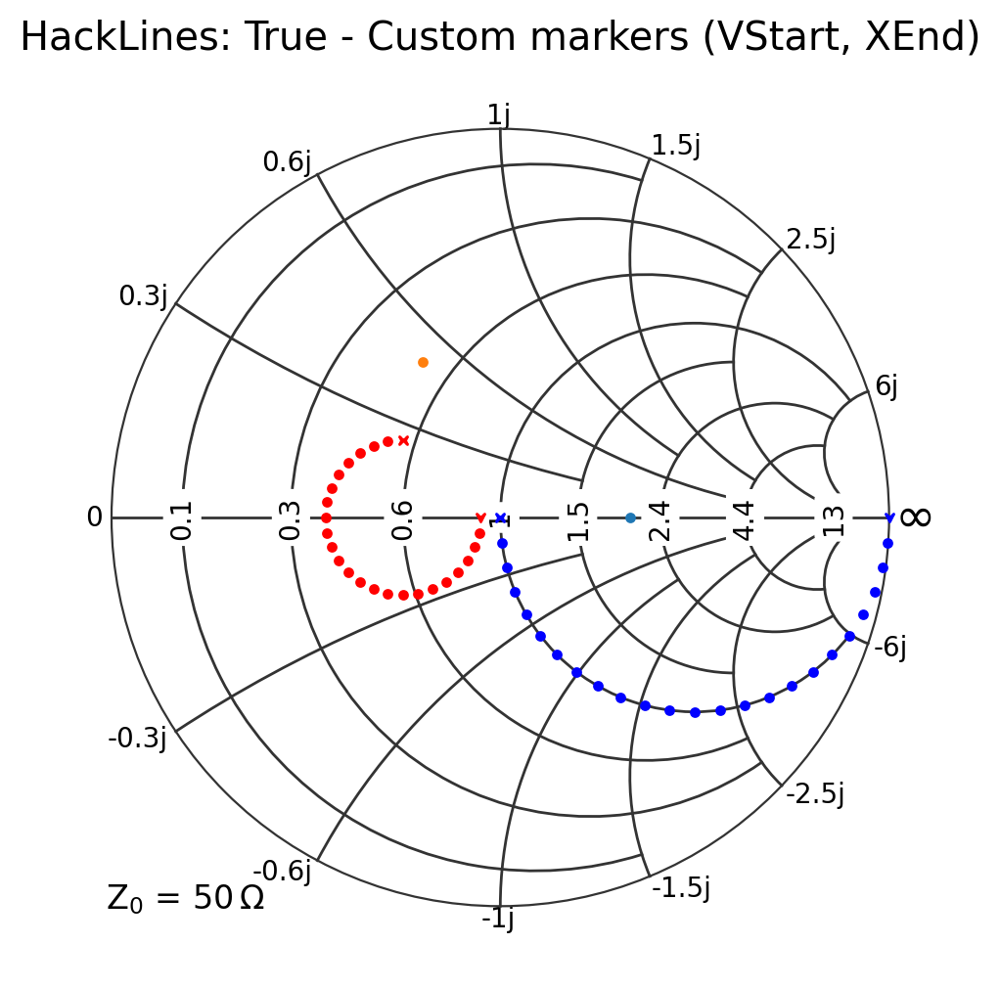

In [28]:
# Example 4: HackLines: True, custom markers for start and end (VStartMarker and XEndMarker), Rotate: False
VStartMarker = np.array([[0, 0], [0.5, 0.5], [0, -0.5], [-0.5, 0.5], [0, 0]])
XEndMarker = np.array(
    [[0, 0], [0.5, 0.5], [0.25, 0], [0.5, -0.5], [0, 0], [-0.5, -0.5], [-0.25, 0], [-0.5, 0.5], [0, 0]]
)

sc = {
    "plot_marker_hack": True,
    "plot_marker_rotate": False,
    "plot_marker_start": VStartMarker,
    "plot_marker_end": XEndMarker,
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", ls="", datatype=S_PARAMETER, markersize=8, **mykw)
plt.plot(z_data, "r", ls="", datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.title("HackLines: True - Custom markers (VStart, XEnd)")
plt.show()

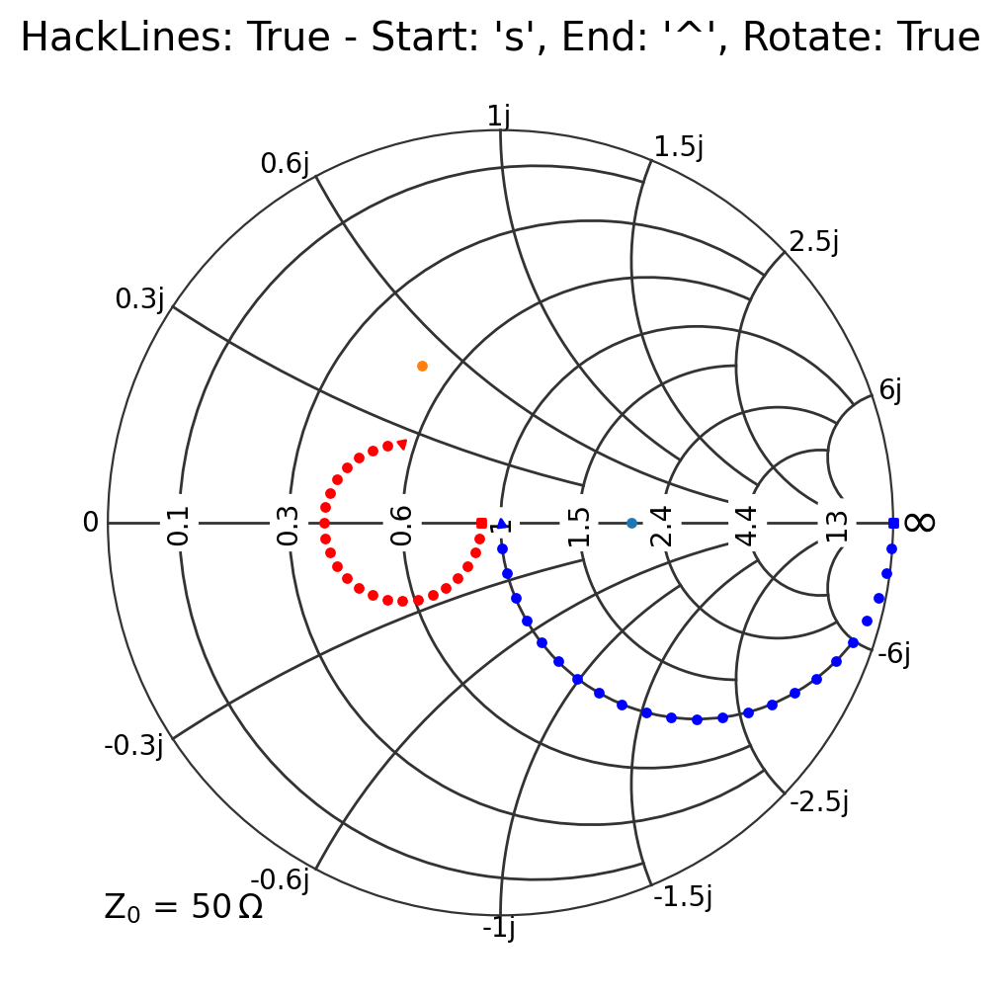

In [29]:
# Example 5: HackLines: True, StartMarker: 's', EndMarker: '^', Rotate: True
sc = {
    "plot_marker_hack": True,
    "plot_marker_rotate": True,
    "plot_marker_start": "s",
    "plot_marker_end": "^",
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", ls="", datatype=S_PARAMETER, markersize=8, **mykw)
plt.plot(z_data, "r", ls="", datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.title("HackLines: True - Start: 's', End: '^', Rotate: True")
plt.show()

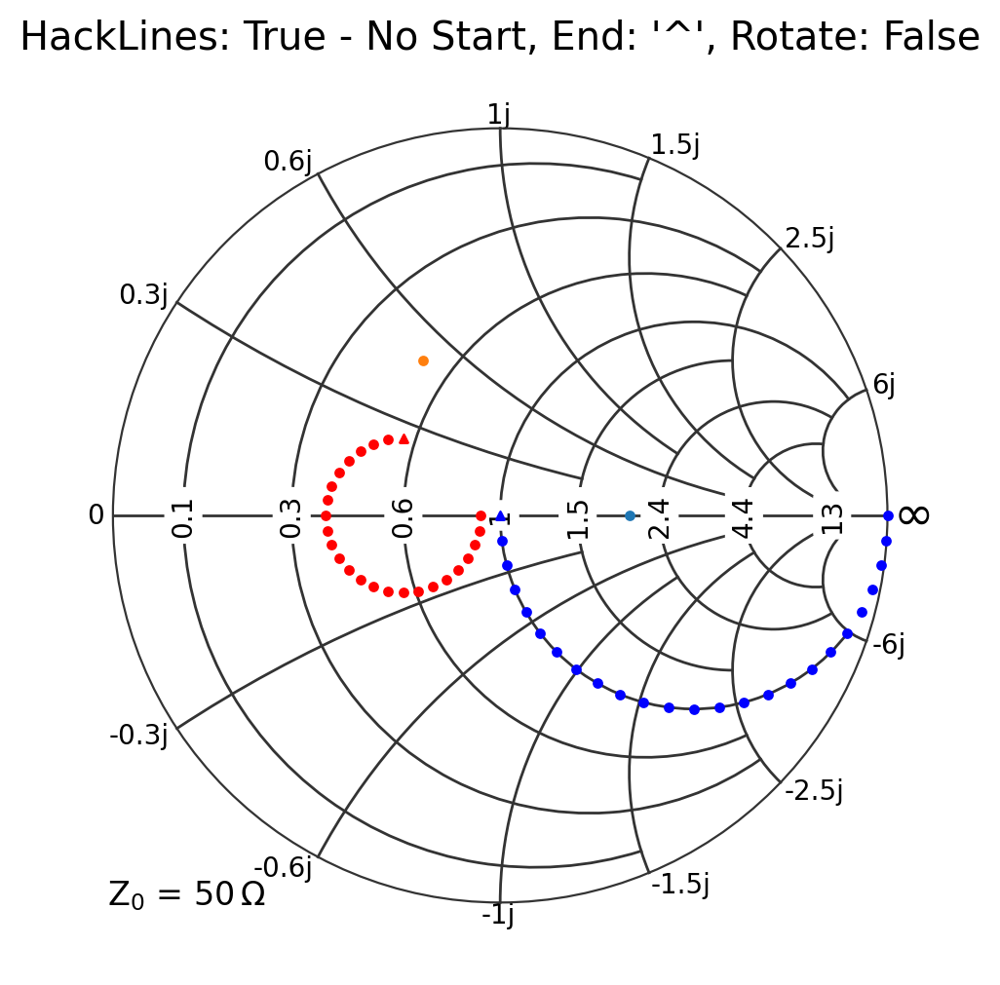

In [30]:
# Example 6: HackLines: True, StartMarker: None, EndMarker: '^', Rotate: False
sc = {
    "plot_marker_hack": True,
    "plot_marker_rotate": False,
    "plot_marker_start": None,
    "plot_marker_end": "^",
}

N = 25
Z0 = 50
sp_data = 0.5 + 0.5 * np.exp(-1j * np.linspace(0, np.pi, N))
Gamma = -0.25 + 0.20 * np.exp(-1j * np.linspace(0, 1.5 * np.pi, N))
z_data = utils.calc_load(Z0, Gamma)

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", **sc)

mykw = {"markevery": 1}

plt.plot(sp_data, "b", ls="", datatype=S_PARAMETER, markersize=8, **mykw)
plt.plot(z_data, "r", ls="", datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(100, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.plot(25 + 25j, datatype=Z_PARAMETER, markersize=8, **mykw)
plt.title("HackLines: True - No Start, End: '^', Rotate: False")
plt.show()

### Interpolation

These examples demonstrate how interpolation and equipoint settings affect the Smith chart rendering.

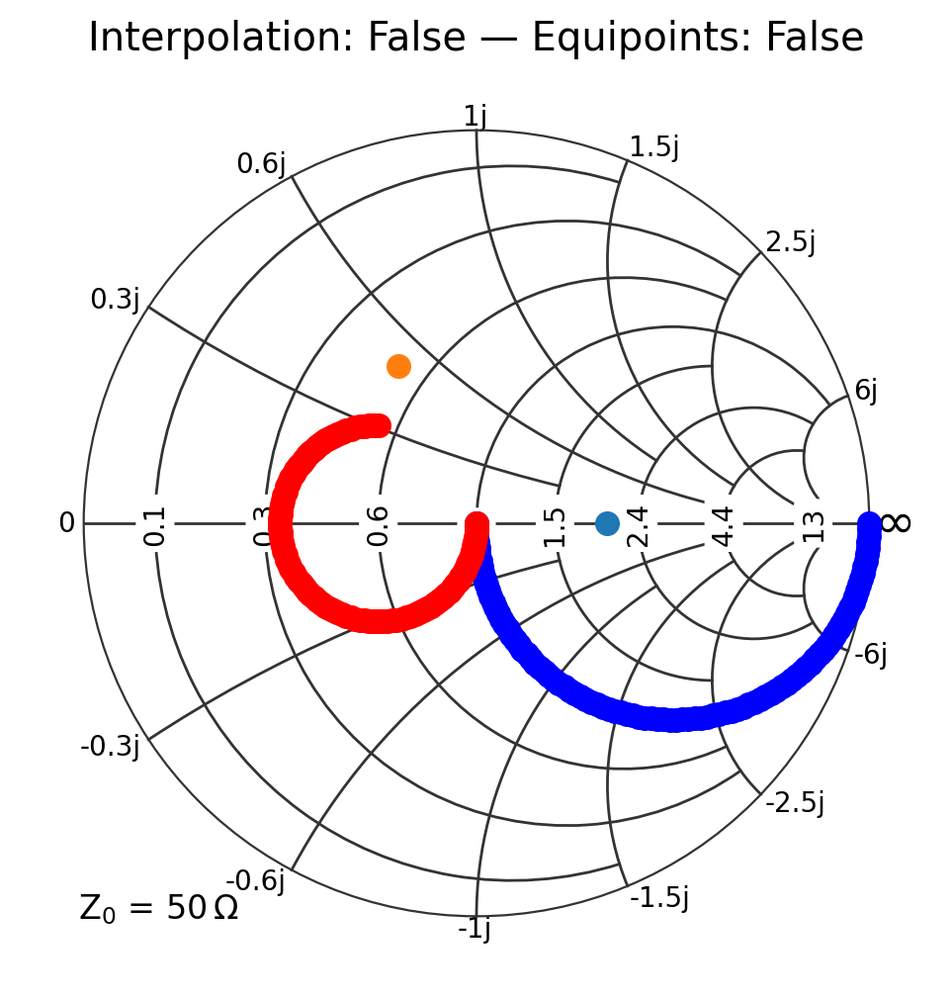

In [31]:
# Example 1: Interpolation=False, Equipoints=False
kw = {"interpolate": False, "equipoints": False}

plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith")
plot_example("Interpolation: False — Equipoints: False", marker="o", **kw)
plt.show()

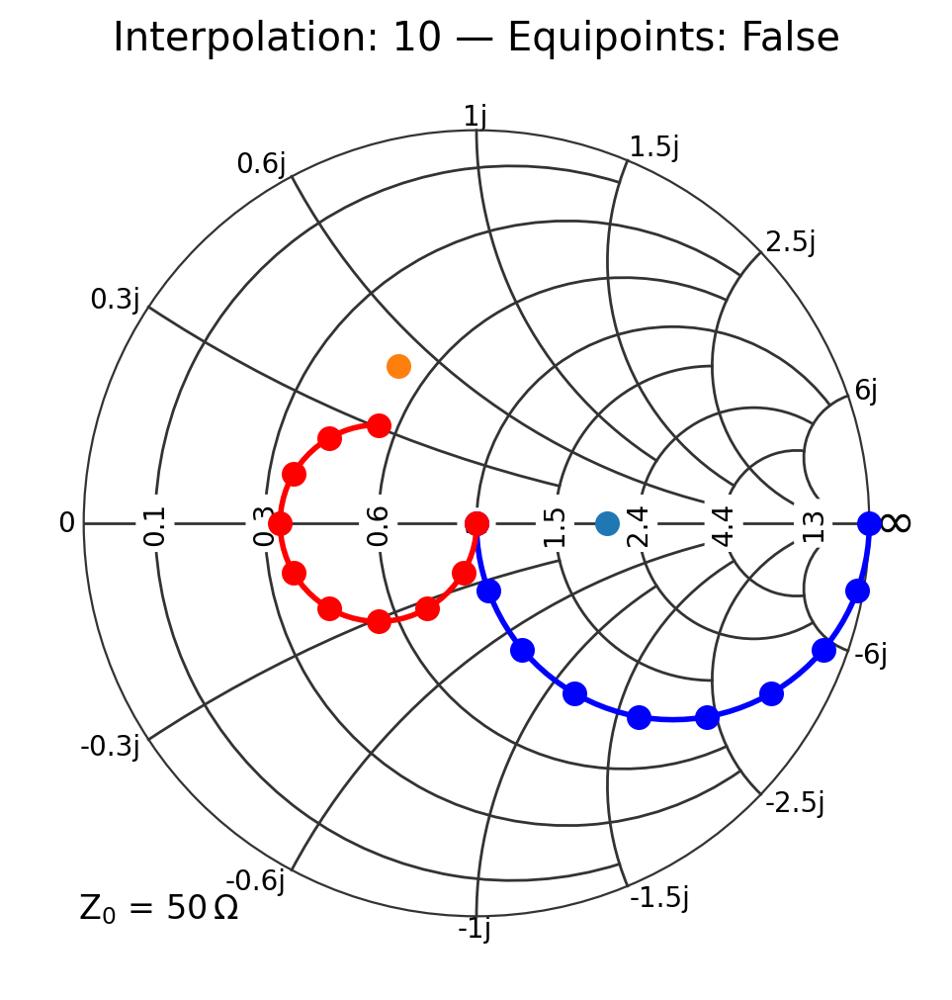

In [32]:
# Example 2: Interpolation=10, Equipoints=False
kw = {"interpolate": 5, "equipoints": False}
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith")
plot_example("Interpolation: 10 — Equipoints: False", N=10, marker="o", **kw)
plt.show()

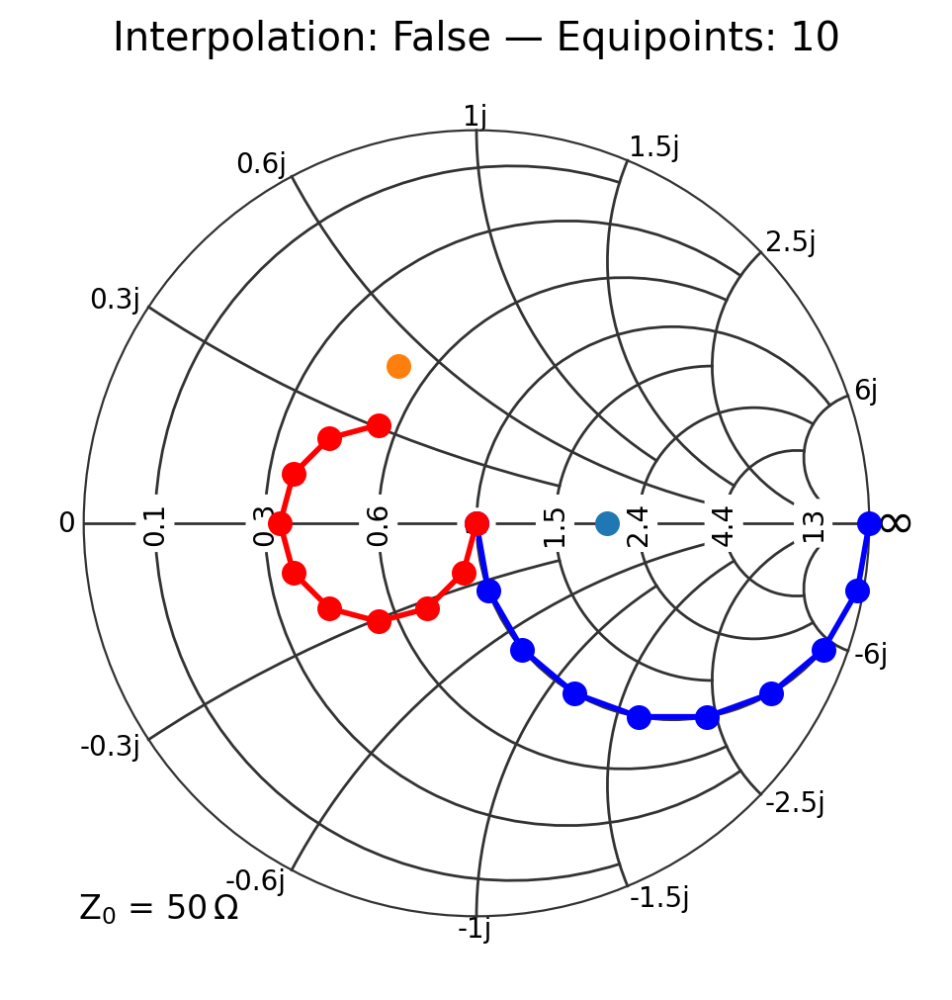

In [33]:
# Example 3: Interpolation=False, Equipoints=10
kw = {"interpolate": False, "equipoints": 10}
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith")
plot_example("Interpolation: False — Equipoints: 10", marker="o", **kw)
plt.show()

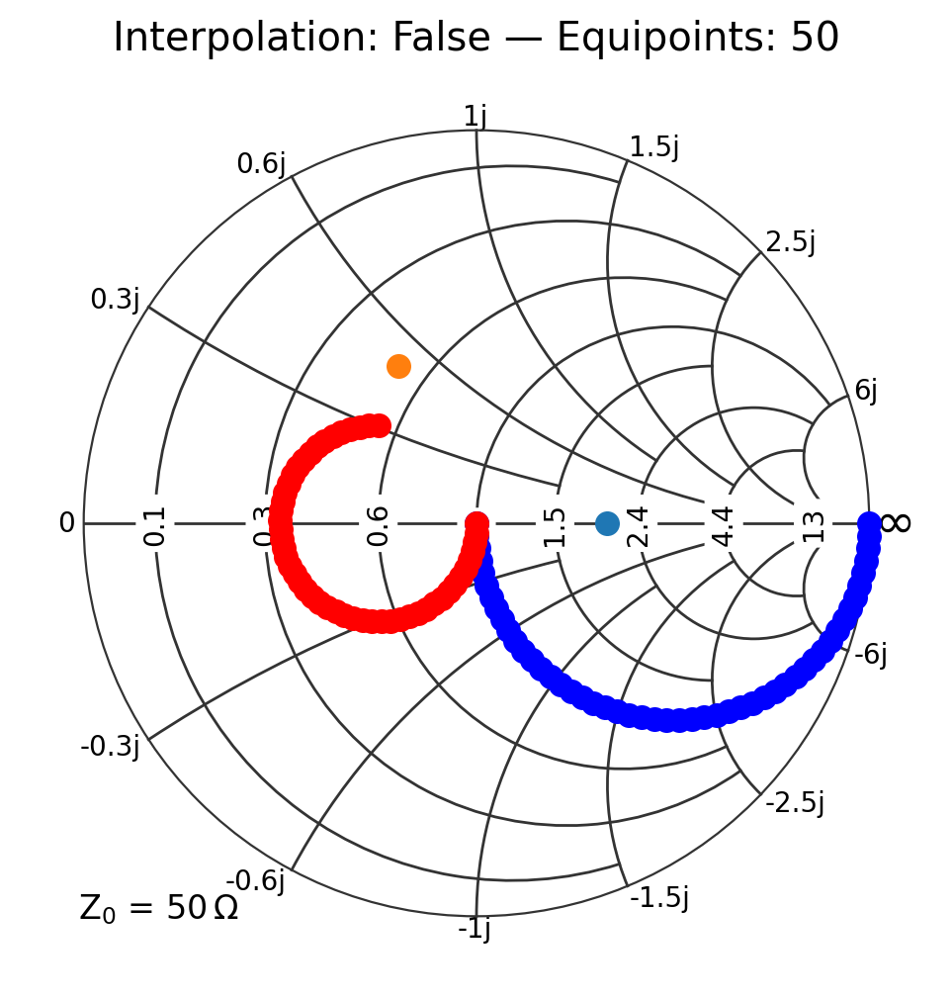

In [34]:
# Example 4: Interpolation=False, Equipoints=50
kw = {"interpolate": False, "equipoints": 50}
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith")
plot_example("Interpolation: False — Equipoints: 50", marker="o", **kw)
plt.show()

### Miscellaneous

This section demonstrates miscellaneous Smith chart settings, such as custom legends and the use of minor fancy dividers.

#### Legend Example

This example shows a Smith chart with a custom legend.

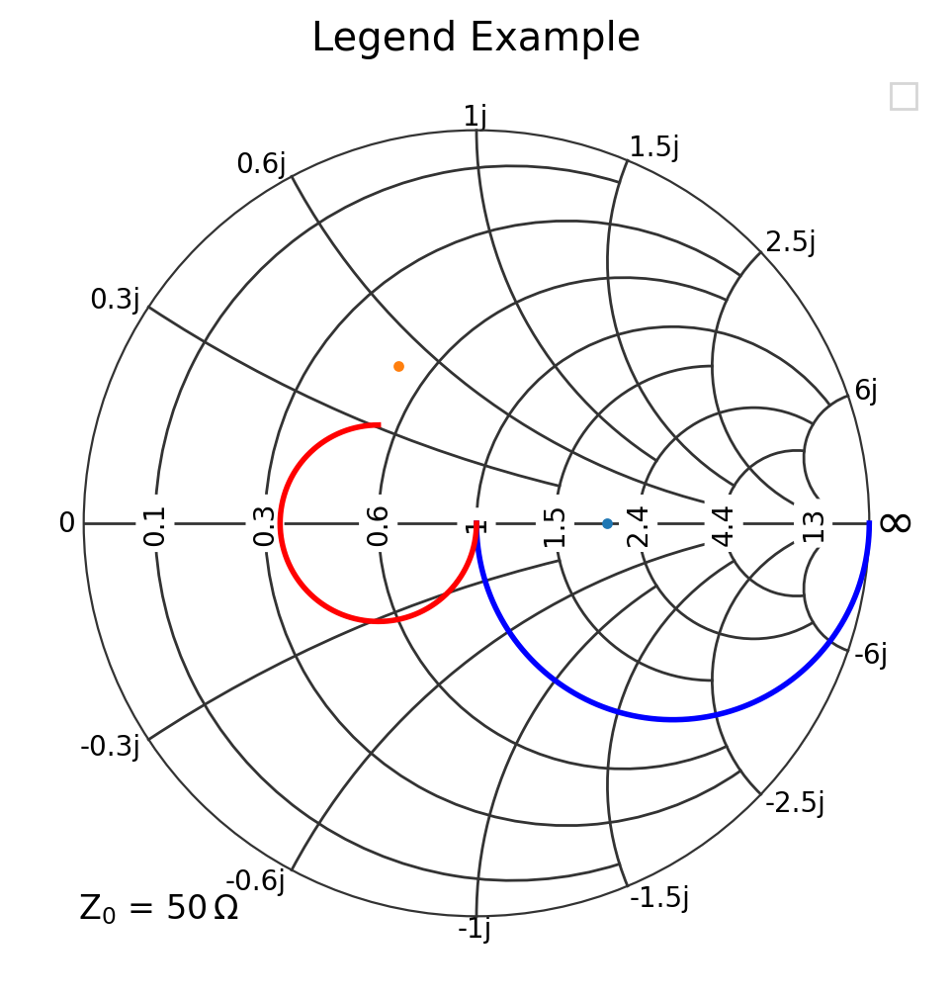

In [35]:
plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1, projection="smith", plot_marker_hack=True)
plot_example("Legend Example")
plt.legend(["S11", "S22", "Polyline", "Z → 0.125λ"])
plt.show()

#### Minor Fancy Dividers

This example demonstrates the effect of minor fancy dividers on the Smith chart grid.

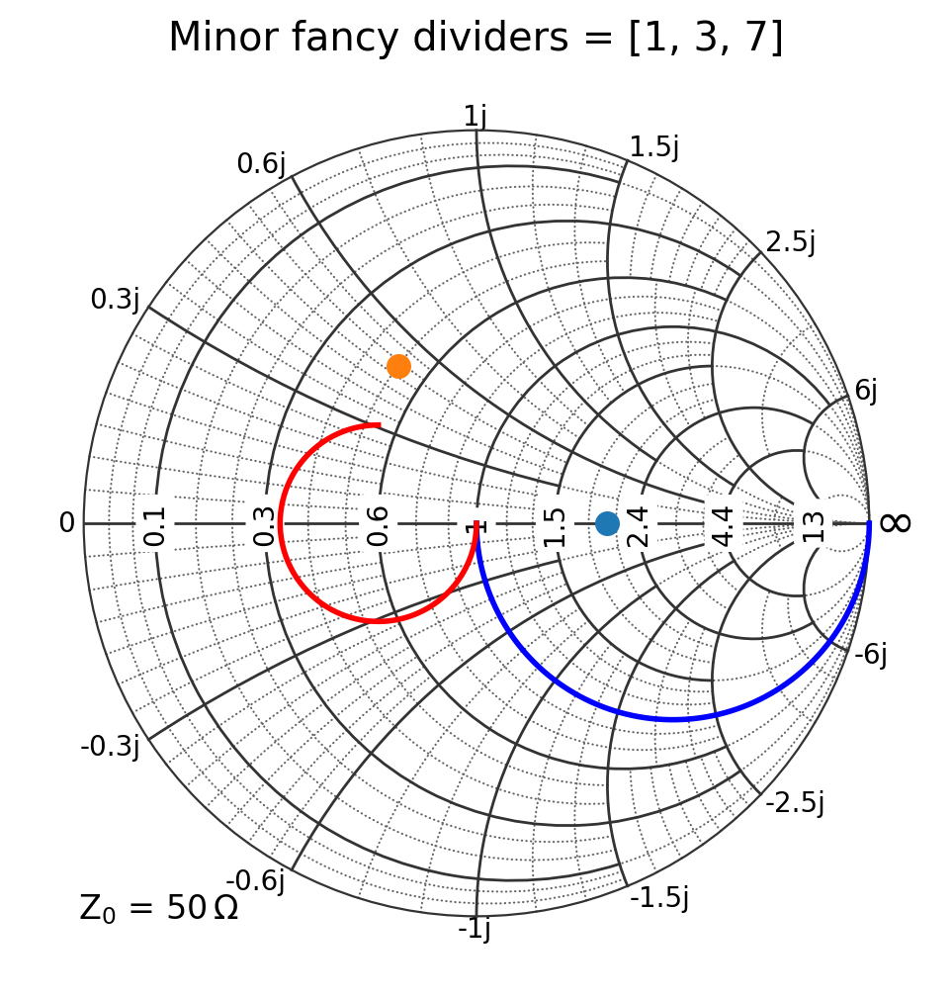

In [36]:
plt.figure(figsize=(6, 6))
plt.subplot(
    1,
    1,
    1,
    projection="smith",
    grid_minor_enable=True,
    grid_minor_fancy=True,
    grid_minor_fancy_dividers=[1, 3, 7],
)
plot_example("Minor fancy dividers = [1, 3, 7]")
plt.show()